<a href="https://colab.research.google.com/github/pavankum/colab-fold-files/blob/main/ECDs_only_tetramer_Apo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.5: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5).

Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb), [v1.5.2](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.2/AlphaFold2.ipynb), [v1.5.3-patch](https://colab.research.google.com/github/sokrypton/ColabFold/blob/56c72044c7d51a311ca99b953a71e552fdc042e1/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

In [1]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'ECDs_only_tetramer_Apo' #@param {type:"string"}
# number of models to use
num_relax = 5 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "pdb100" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))

jobname ECDs_only_tetramer_Apo_184a4
sequence LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT
length 422


In [2]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  if os.environ.get('TPU_NAME', False) != False:
    os.system("pip uninstall -y jax jaxlib")
    os.system("pip install --no-warn-conflicts --upgrade dm-haiku==0.0.10 'jax[cuda12_pip]'==0.3.25 -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Miniforge3-Linux-x86_64.sh")
    os.system("bash Miniforge3-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

installing colabfold...
installing conda...
installing hhsuite and amber...
CPU times: user 315 ms, sys: 47.1 ms, total: 362 ms
Wall time: 1min 32s


In [3]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [4]:
#@markdown ### Advanced settings
model_type = "alphafold2_multimer_v3" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3", "deepfold_v1"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "0" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
#@markdown - if `auto` selected, will use `num_recycles=20` if `model_type=alphafold2_multimer_v3`, else `num_recycles=3` .
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use `tol=0.5` if `model_type=alphafold2_multimer_v3` else `tol=0.0`.
relax_max_iterations = 2000 #@param [0, 200, 2000] {type:"raw"}
#@markdown - max amber relax iterations, `0` = unlimited (AlphaFold2 default, can take very long)
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "auto" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = False #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = True #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 300 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive2.drive import GoogleDrive
  from pydrive2.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

You are logged into Google Drive and are good to go!


2024-11-12 19:55:54,567 Running on GPU
2024-11-12 19:55:54,883 Found 9 citations for tools or databases
2024-11-12 19:55:54,884 Query 1/1: ECDs_only_tetramer_Apo_184a4 (length 422)


PENDING:   0%|          | 0/300 [elapsed: 00:01 remaining: ?]

2024-11-12 19:55:55,897 Sleeping for 9s. Reason: PENDING


RUNNING:   3%|▎         | 9/300 [elapsed: 00:11 remaining: 05:56]

2024-11-12 19:56:05,913 Sleeping for 8s. Reason: RUNNING


RUNNING:   6%|▌         | 17/300 [elapsed: 00:20 remaining: 05:31]

2024-11-12 19:56:14,936 Sleeping for 9s. Reason: RUNNING


COMPLETE: 100%|██████████| 300/300 [elapsed: 00:32 remaining: 00:00]


2024-11-12 19:56:38,649 Sequence 0 found templates: ['7oly_K', '7mrz_C', '2l5s_A', '6mac_K', '2pjy_C', '2k3g_A', '2qjb_D', '2qja_D', '3kfd_L', '2qj9_D', '2qj9_C', '1rew_D', '2qjb_C', '3kfd_K', '2h62_C', '2qja_C', '3evs_C', '1es7_B', '7yru_A', '7mrz_C']
2024-11-12 19:56:42,807 Sequence 1 found templates: ['7mrz_C', '2goo_C', '7u5p_A', '1s4y_A', '1bte_A', '1nys_A', '1nyu_A', '1nyu_C', '7l0j_B', '7ppc_L', '7u5o_F', '7ppc_J', '7u5o_E', '2hlr_A', '2hlq_A', '7ppa_D', '7ppb_B', '7ppa_C', '7ppc_I', '7u5o_G']


PENDING:   0%|          | 0/300 [elapsed: 00:01 remaining: ?]

2024-11-12 19:56:43,834 Sleeping for 7s. Reason: PENDING


RUNNING:   2%|▏         | 7/300 [elapsed: 00:09 remaining: 06:18]

2024-11-12 19:56:51,858 Sleeping for 8s. Reason: RUNNING


COMPLETE: 100%|██████████| 300/300 [elapsed: 00:19 remaining: 00:00]


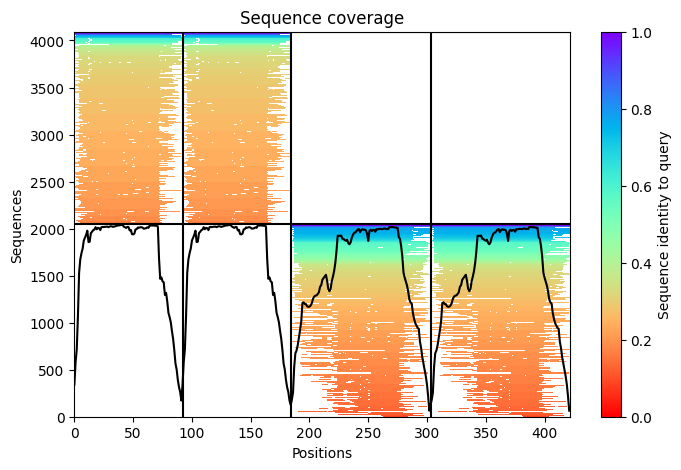

2024-11-12 19:57:04,004 Setting max_seq=508, max_extra_seq=2048
2024-11-12 19:58:30,564 alphafold2_multimer_v3_model_1_seed_000 recycle=0 pLDDT=58.5 pTM=0.32 ipTM=0.129
2024-11-12 19:58:30,566 alphafold2_multimer_v3_model_1_seed_000 took 79.2s (0 recycles)


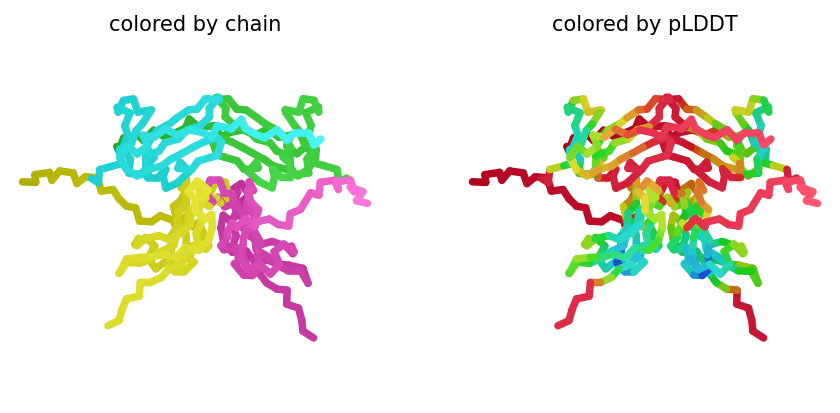

2024-11-12 19:58:40,531 alphafold2_multimer_v3_model_2_seed_000 recycle=0 pLDDT=59.3 pTM=0.297 ipTM=0.11
2024-11-12 19:58:40,532 alphafold2_multimer_v3_model_2_seed_000 took 9.5s (0 recycles)


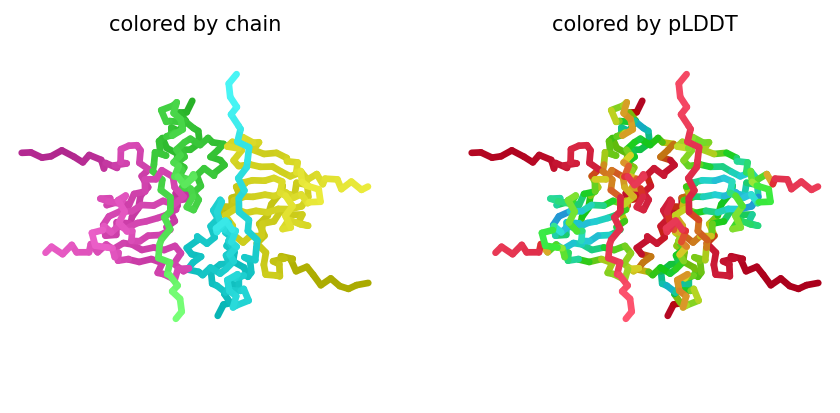

2024-11-12 19:58:50,528 alphafold2_multimer_v3_model_3_seed_000 recycle=0 pLDDT=60.3 pTM=0.315 ipTM=0.127
2024-11-12 19:58:50,529 alphafold2_multimer_v3_model_3_seed_000 took 9.6s (0 recycles)


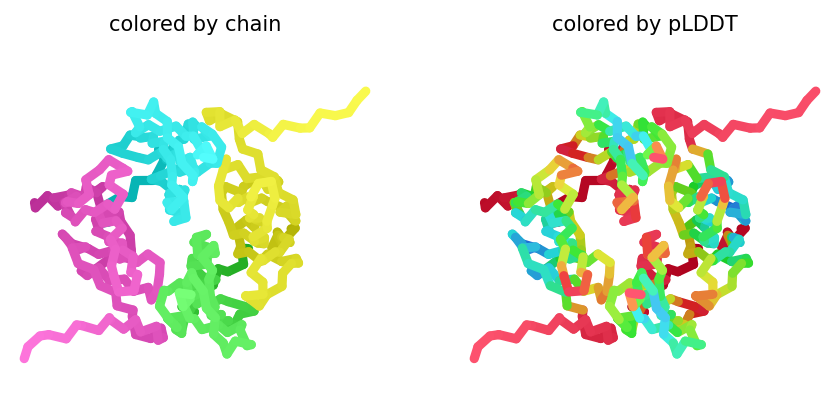

2024-11-12 19:59:00,642 alphafold2_multimer_v3_model_4_seed_000 recycle=0 pLDDT=62.4 pTM=0.33 ipTM=0.145
2024-11-12 19:59:00,643 alphafold2_multimer_v3_model_4_seed_000 took 9.6s (0 recycles)


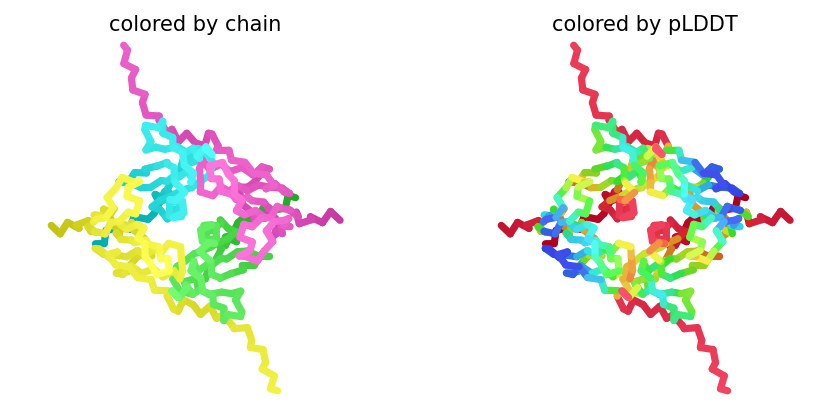

2024-11-12 19:59:10,772 alphafold2_multimer_v3_model_5_seed_000 recycle=0 pLDDT=59.5 pTM=0.34 ipTM=0.182
2024-11-12 19:59:10,774 alphafold2_multimer_v3_model_5_seed_000 took 9.7s (0 recycles)


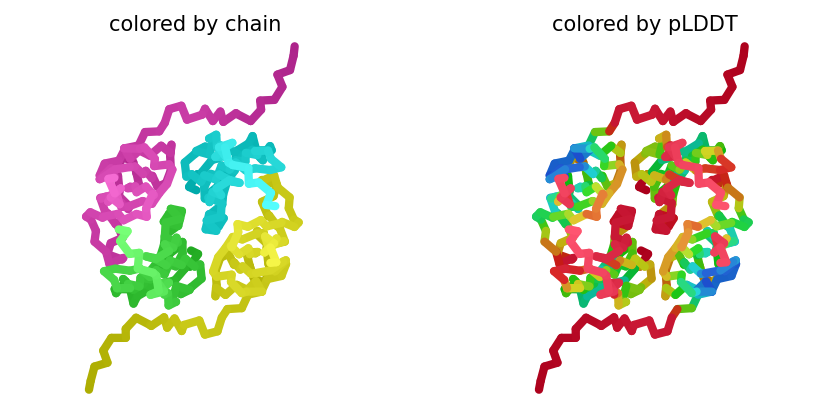

2024-11-12 19:59:20,934 alphafold2_multimer_v3_model_1_seed_001 recycle=0 pLDDT=56.7 pTM=0.315 ipTM=0.122
2024-11-12 19:59:20,935 alphafold2_multimer_v3_model_1_seed_001 took 9.7s (0 recycles)


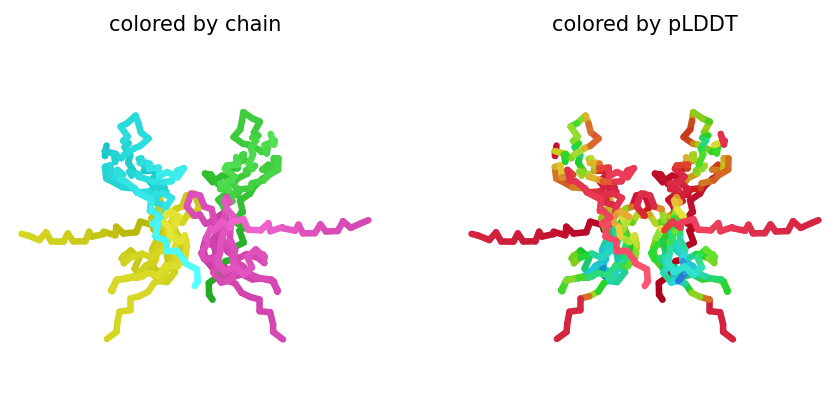

2024-11-12 19:59:31,176 alphafold2_multimer_v3_model_2_seed_001 recycle=0 pLDDT=59.8 pTM=0.294 ipTM=0.0983
2024-11-12 19:59:31,177 alphafold2_multimer_v3_model_2_seed_001 took 9.8s (0 recycles)


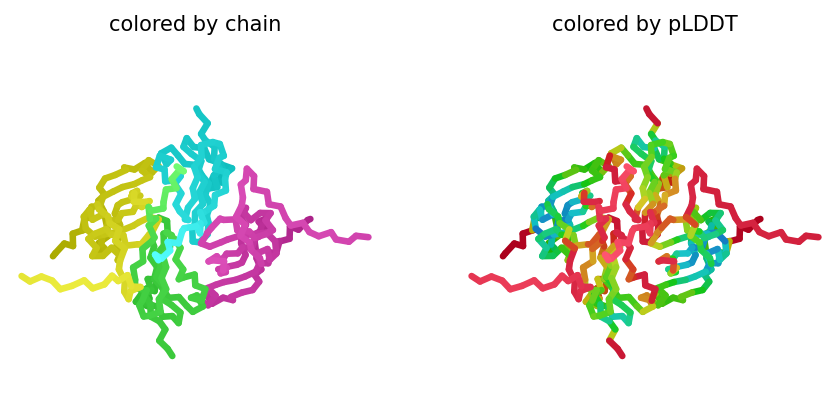

2024-11-12 19:59:41,415 alphafold2_multimer_v3_model_3_seed_001 recycle=0 pLDDT=60.2 pTM=0.307 ipTM=0.119
2024-11-12 19:59:41,416 alphafold2_multimer_v3_model_3_seed_001 took 9.8s (0 recycles)


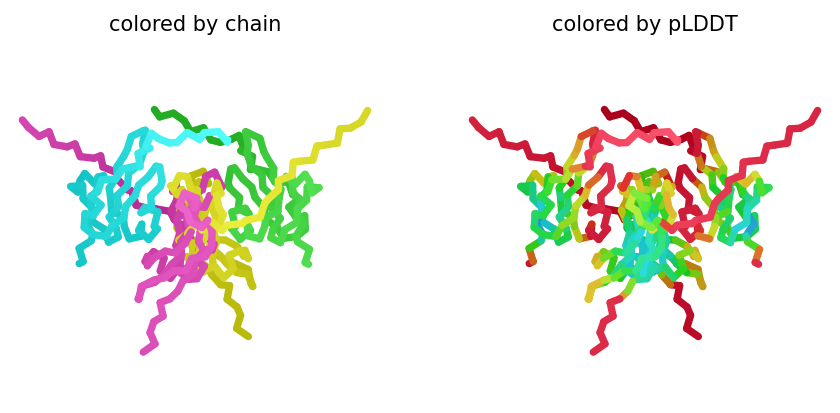

2024-11-12 19:59:51,625 alphafold2_multimer_v3_model_4_seed_001 recycle=0 pLDDT=60.6 pTM=0.325 ipTM=0.133
2024-11-12 19:59:51,626 alphafold2_multimer_v3_model_4_seed_001 took 9.8s (0 recycles)


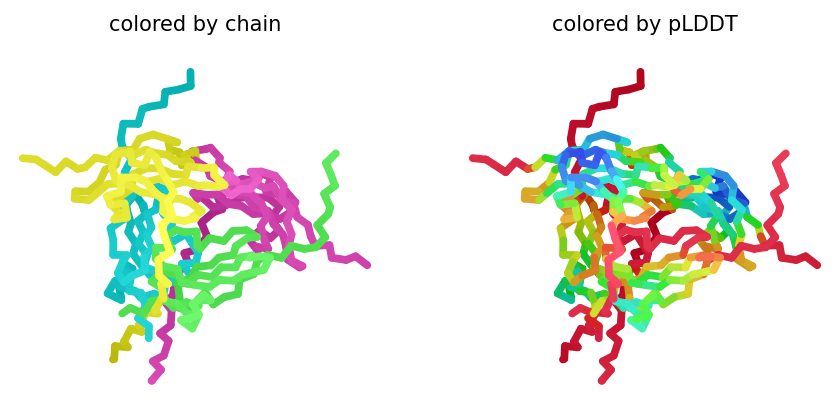

2024-11-12 20:00:01,802 alphafold2_multimer_v3_model_5_seed_001 recycle=0 pLDDT=59.7 pTM=0.3 ipTM=0.101
2024-11-12 20:00:01,803 alphafold2_multimer_v3_model_5_seed_001 took 9.8s (0 recycles)


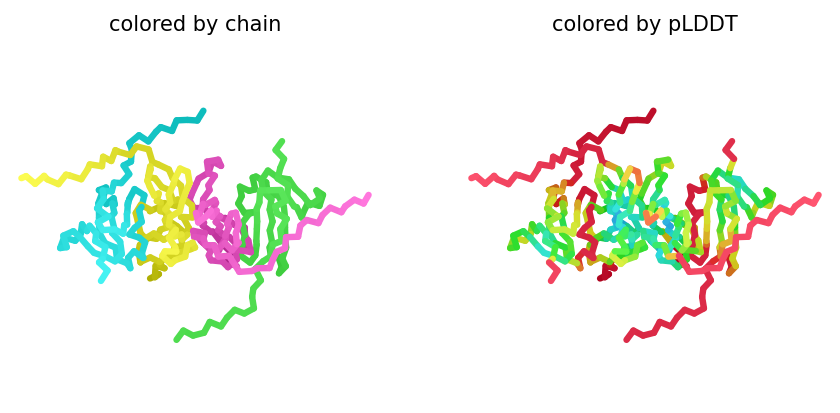

2024-11-12 20:00:11,956 alphafold2_multimer_v3_model_1_seed_002 recycle=0 pLDDT=58 pTM=0.305 ipTM=0.114
2024-11-12 20:00:11,957 alphafold2_multimer_v3_model_1_seed_002 took 9.7s (0 recycles)


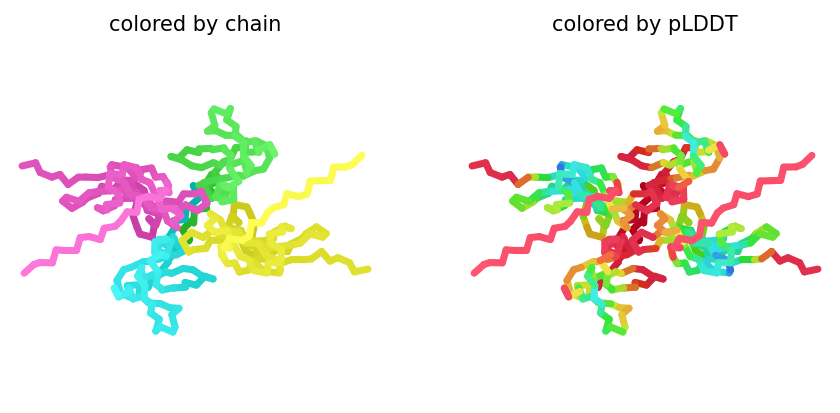

2024-11-12 20:00:22,077 alphafold2_multimer_v3_model_2_seed_002 recycle=0 pLDDT=59.7 pTM=0.308 ipTM=0.112
2024-11-12 20:00:22,078 alphafold2_multimer_v3_model_2_seed_002 took 9.7s (0 recycles)


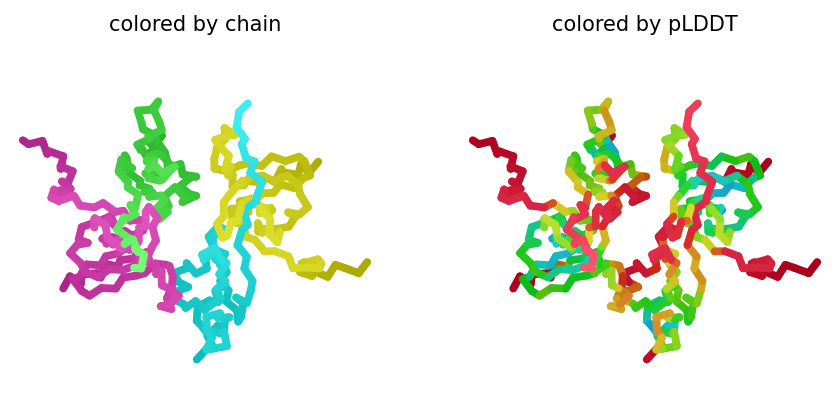

2024-11-12 20:00:32,193 alphafold2_multimer_v3_model_3_seed_002 recycle=0 pLDDT=59.7 pTM=0.309 ipTM=0.122
2024-11-12 20:00:32,195 alphafold2_multimer_v3_model_3_seed_002 took 9.7s (0 recycles)


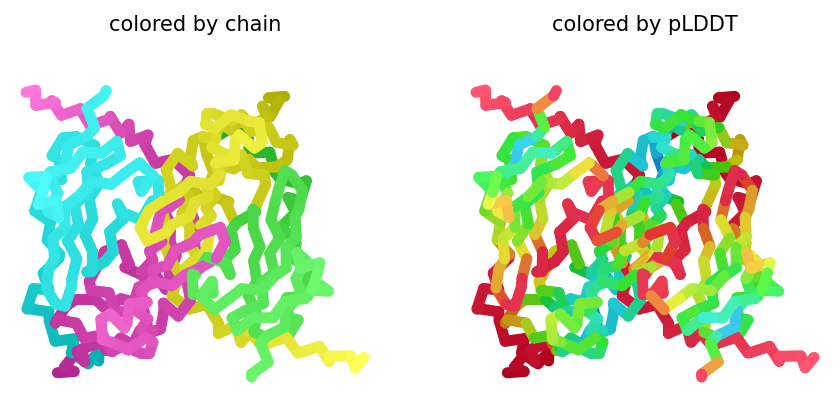

2024-11-12 20:00:42,350 alphafold2_multimer_v3_model_4_seed_002 recycle=0 pLDDT=62 pTM=0.335 ipTM=0.146
2024-11-12 20:00:42,351 alphafold2_multimer_v3_model_4_seed_002 took 9.7s (0 recycles)


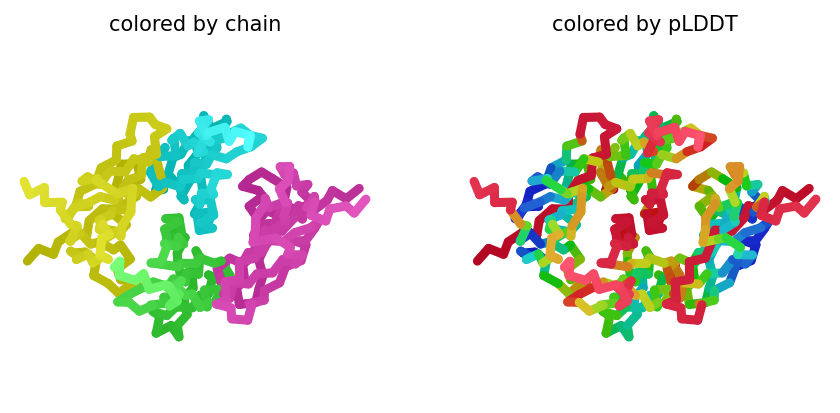

2024-11-12 20:00:52,509 alphafold2_multimer_v3_model_5_seed_002 recycle=0 pLDDT=59.5 pTM=0.32 ipTM=0.14
2024-11-12 20:00:52,510 alphafold2_multimer_v3_model_5_seed_002 took 9.7s (0 recycles)


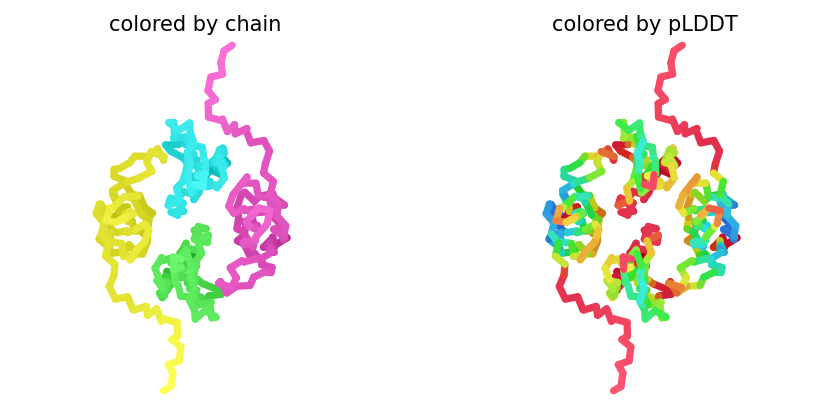

2024-11-12 20:01:02,658 alphafold2_multimer_v3_model_1_seed_003 recycle=0 pLDDT=58.5 pTM=0.314 ipTM=0.115
2024-11-12 20:01:02,660 alphafold2_multimer_v3_model_1_seed_003 took 9.7s (0 recycles)


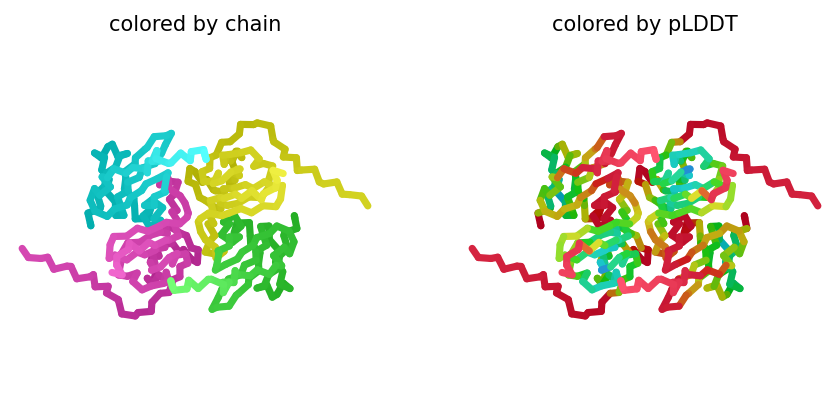

2024-11-12 20:01:13,333 alphafold2_multimer_v3_model_2_seed_003 recycle=0 pLDDT=59.3 pTM=0.301 ipTM=0.112
2024-11-12 20:01:13,334 alphafold2_multimer_v3_model_2_seed_003 took 9.8s (0 recycles)


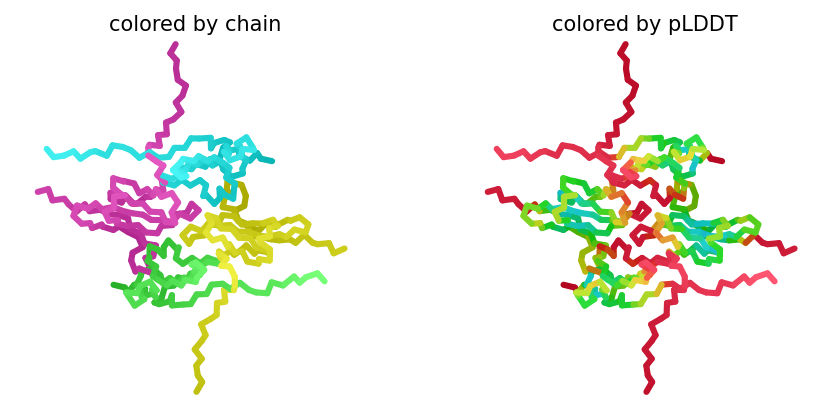

2024-11-12 20:01:23,533 alphafold2_multimer_v3_model_3_seed_003 recycle=0 pLDDT=60 pTM=0.302 ipTM=0.125
2024-11-12 20:01:23,534 alphafold2_multimer_v3_model_3_seed_003 took 9.8s (0 recycles)


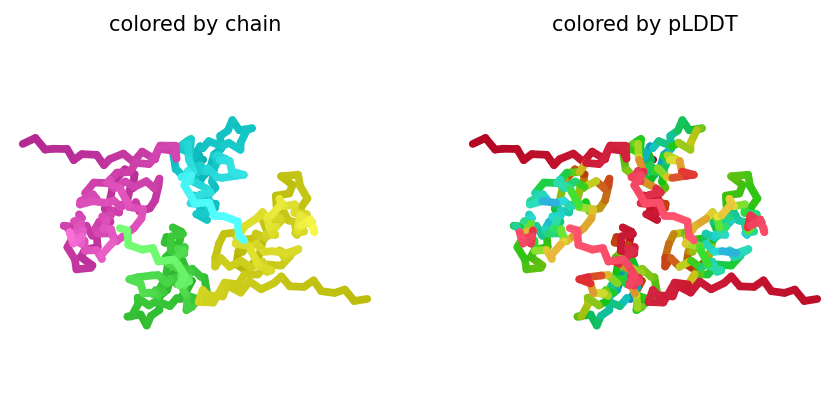

2024-11-12 20:01:33,714 alphafold2_multimer_v3_model_4_seed_003 recycle=0 pLDDT=62.2 pTM=0.333 ipTM=0.149
2024-11-12 20:01:33,716 alphafold2_multimer_v3_model_4_seed_003 took 9.8s (0 recycles)


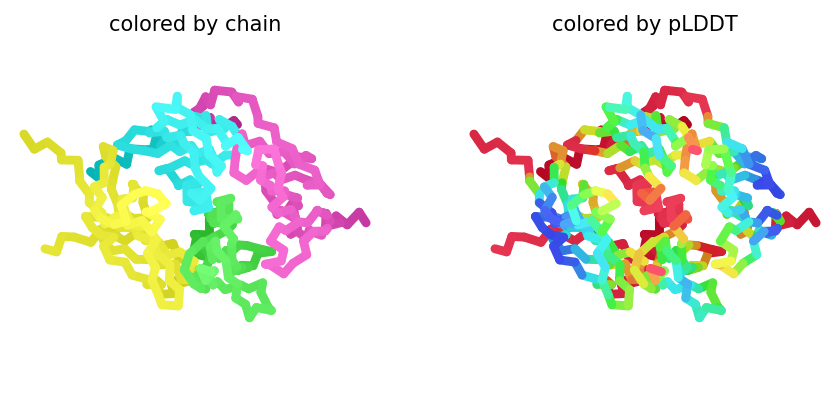

2024-11-12 20:01:43,908 alphafold2_multimer_v3_model_5_seed_003 recycle=0 pLDDT=60 pTM=0.313 ipTM=0.132
2024-11-12 20:01:43,909 alphafold2_multimer_v3_model_5_seed_003 took 9.8s (0 recycles)


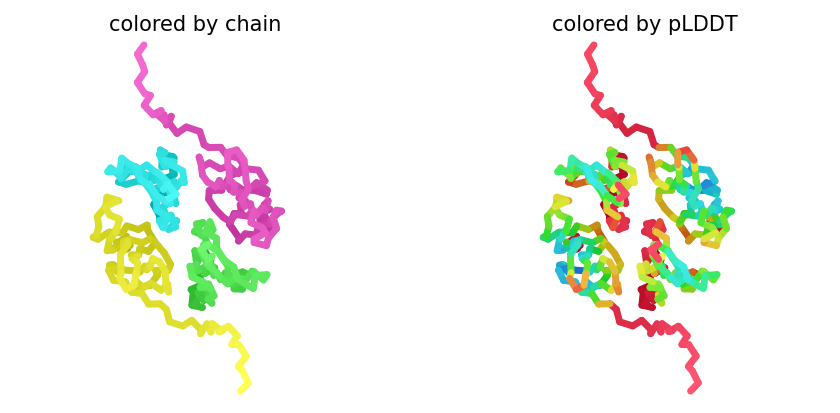

2024-11-12 20:01:54,090 alphafold2_multimer_v3_model_1_seed_004 recycle=0 pLDDT=60.6 pTM=0.31 ipTM=0.134
2024-11-12 20:01:54,091 alphafold2_multimer_v3_model_1_seed_004 took 9.8s (0 recycles)


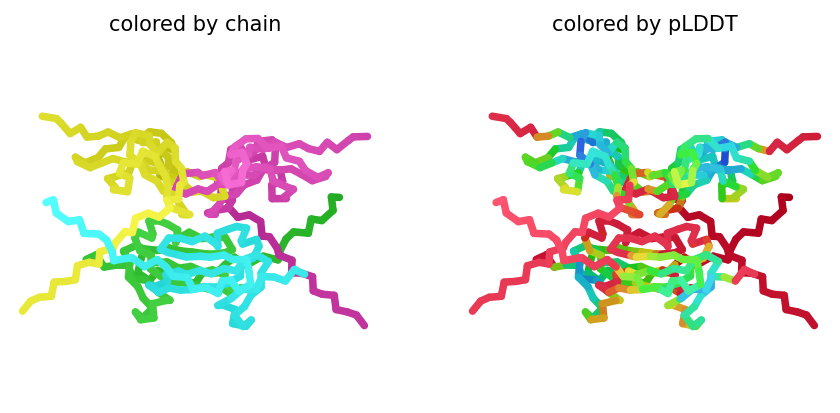

2024-11-12 20:02:04,259 alphafold2_multimer_v3_model_2_seed_004 recycle=0 pLDDT=59.4 pTM=0.302 ipTM=0.111
2024-11-12 20:02:04,260 alphafold2_multimer_v3_model_2_seed_004 took 9.7s (0 recycles)


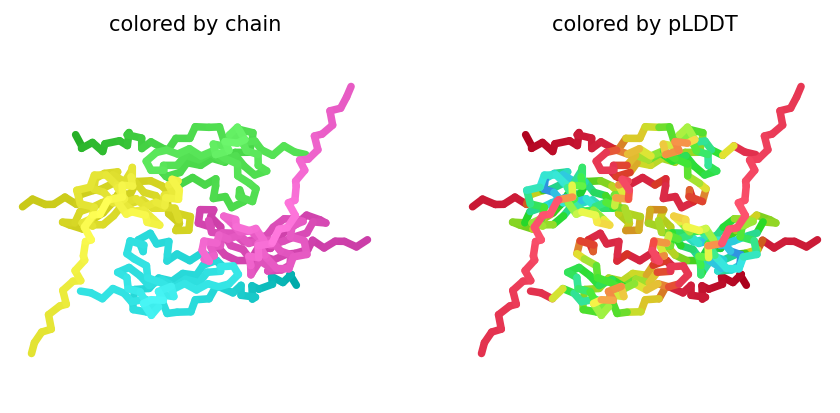

2024-11-12 20:02:14,451 alphafold2_multimer_v3_model_3_seed_004 recycle=0 pLDDT=61.8 pTM=0.317 ipTM=0.119
2024-11-12 20:02:14,453 alphafold2_multimer_v3_model_3_seed_004 took 9.8s (0 recycles)


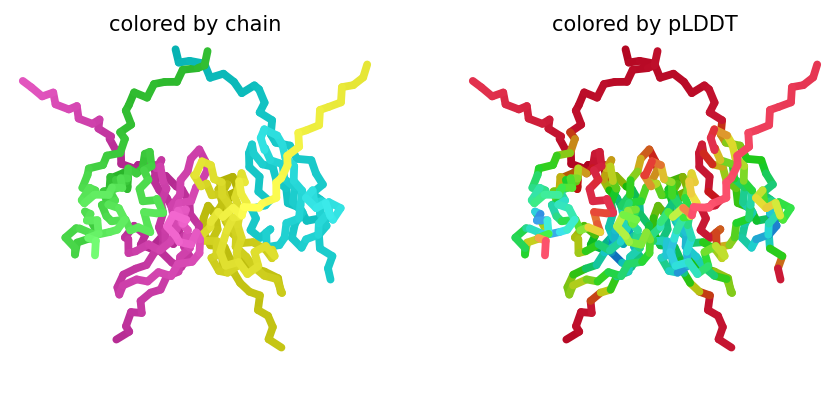

2024-11-12 20:02:24,631 alphafold2_multimer_v3_model_4_seed_004 recycle=0 pLDDT=63.3 pTM=0.336 ipTM=0.15
2024-11-12 20:02:24,632 alphafold2_multimer_v3_model_4_seed_004 took 9.8s (0 recycles)


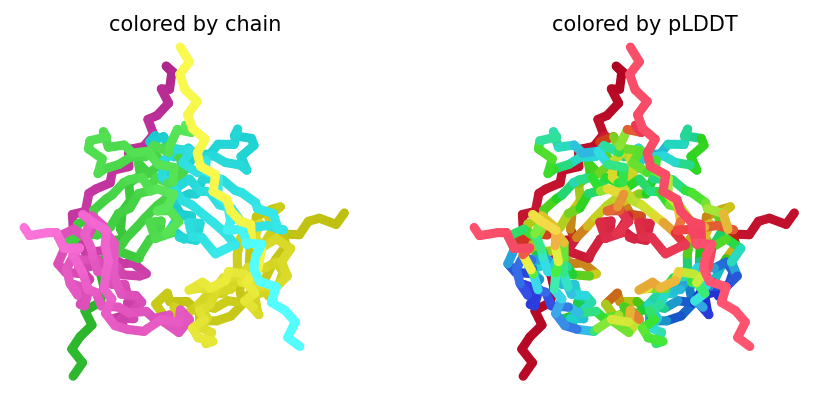

2024-11-12 20:02:34,817 alphafold2_multimer_v3_model_5_seed_004 recycle=0 pLDDT=60.8 pTM=0.31 ipTM=0.113
2024-11-12 20:02:34,819 alphafold2_multimer_v3_model_5_seed_004 took 9.8s (0 recycles)


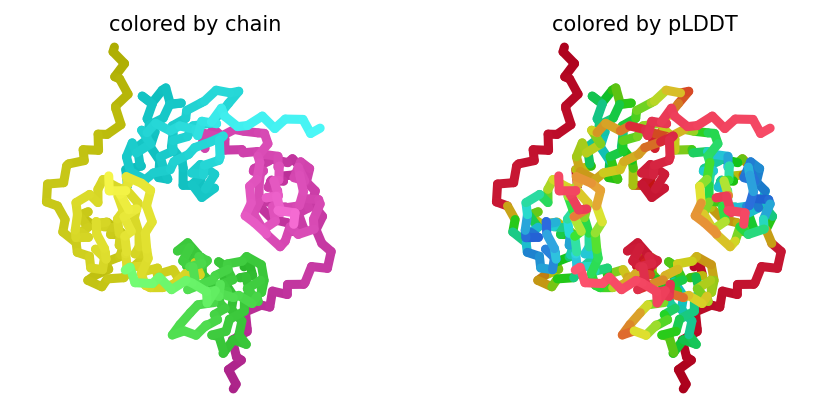

2024-11-12 20:02:44,974 alphafold2_multimer_v3_model_1_seed_005 recycle=0 pLDDT=58.5 pTM=0.316 ipTM=0.119
2024-11-12 20:02:44,975 alphafold2_multimer_v3_model_1_seed_005 took 9.7s (0 recycles)


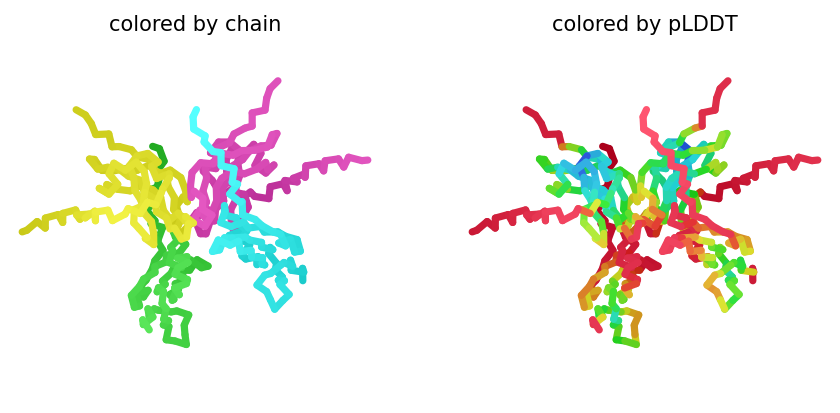

2024-11-12 20:02:55,172 alphafold2_multimer_v3_model_2_seed_005 recycle=0 pLDDT=60 pTM=0.306 ipTM=0.107
2024-11-12 20:02:55,173 alphafold2_multimer_v3_model_2_seed_005 took 9.8s (0 recycles)


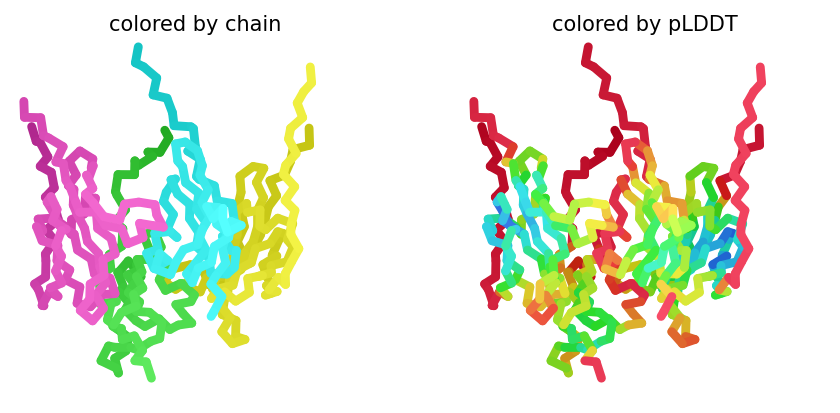

2024-11-12 20:03:05,373 alphafold2_multimer_v3_model_3_seed_005 recycle=0 pLDDT=60.7 pTM=0.318 ipTM=0.134
2024-11-12 20:03:05,374 alphafold2_multimer_v3_model_3_seed_005 took 9.8s (0 recycles)


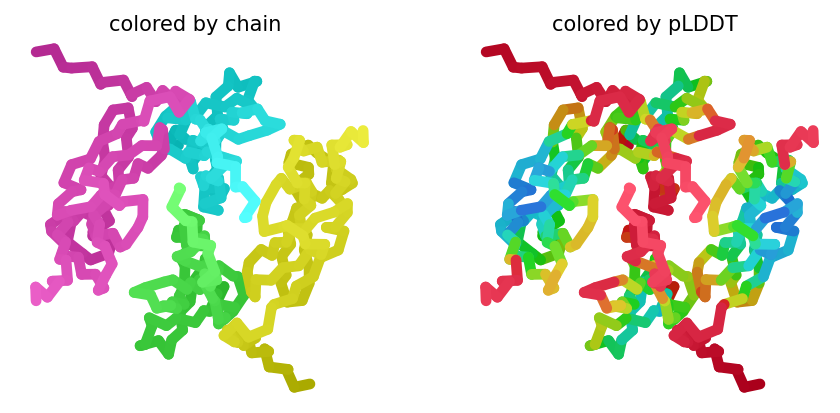

2024-11-12 20:03:15,598 alphafold2_multimer_v3_model_4_seed_005 recycle=0 pLDDT=62.5 pTM=0.351 ipTM=0.168
2024-11-12 20:03:15,599 alphafold2_multimer_v3_model_4_seed_005 took 9.8s (0 recycles)


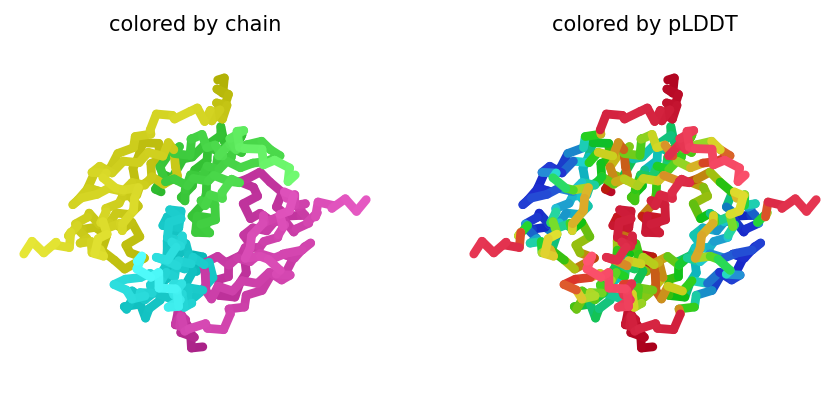

2024-11-12 20:03:25,770 alphafold2_multimer_v3_model_5_seed_005 recycle=0 pLDDT=59.6 pTM=0.313 ipTM=0.118
2024-11-12 20:03:25,771 alphafold2_multimer_v3_model_5_seed_005 took 9.7s (0 recycles)


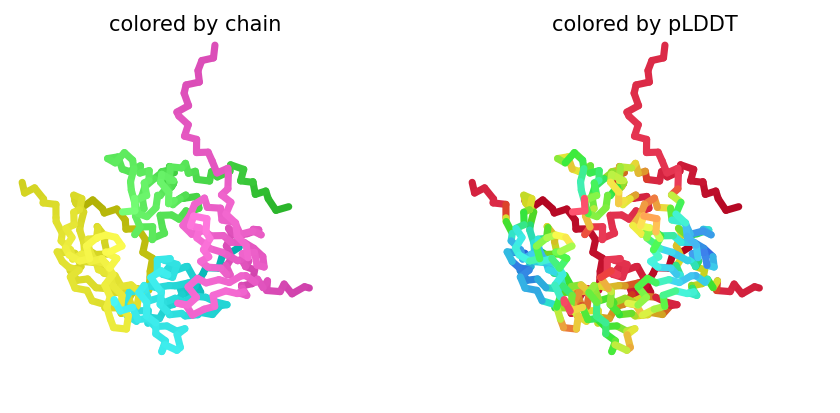

2024-11-12 20:03:35,960 alphafold2_multimer_v3_model_1_seed_006 recycle=0 pLDDT=58.2 pTM=0.318 ipTM=0.122
2024-11-12 20:03:35,962 alphafold2_multimer_v3_model_1_seed_006 took 9.8s (0 recycles)


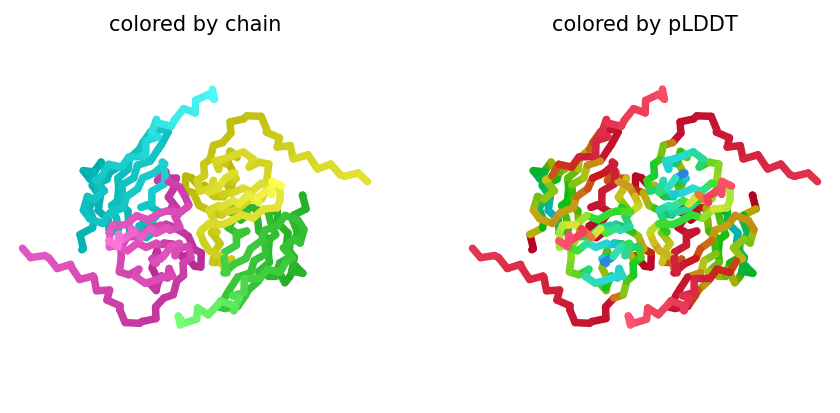

2024-11-12 20:03:46,142 alphafold2_multimer_v3_model_2_seed_006 recycle=0 pLDDT=60.2 pTM=0.308 ipTM=0.112
2024-11-12 20:03:46,143 alphafold2_multimer_v3_model_2_seed_006 took 9.8s (0 recycles)


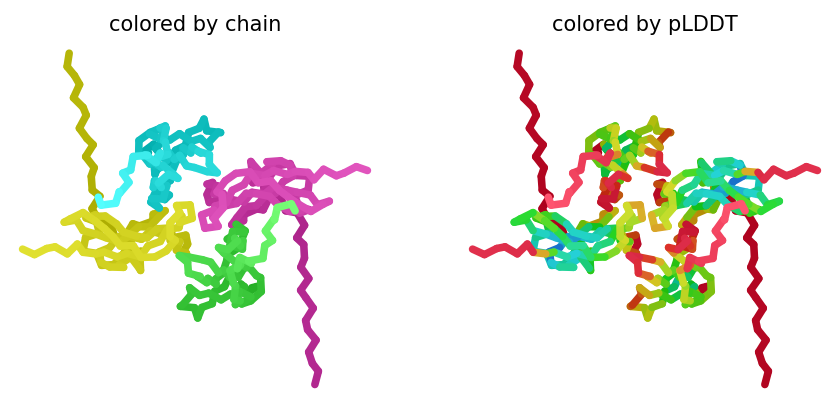

2024-11-12 20:03:56,317 alphafold2_multimer_v3_model_3_seed_006 recycle=0 pLDDT=60.1 pTM=0.299 ipTM=0.105
2024-11-12 20:03:56,318 alphafold2_multimer_v3_model_3_seed_006 took 9.8s (0 recycles)


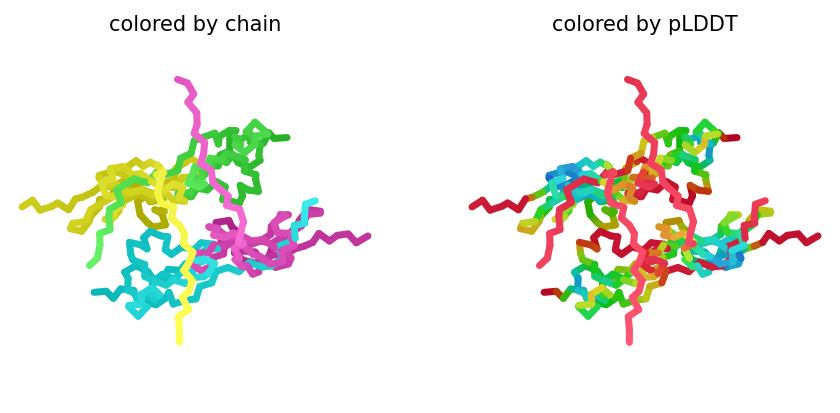

2024-11-12 20:04:06,486 alphafold2_multimer_v3_model_4_seed_006 recycle=0 pLDDT=62.5 pTM=0.332 ipTM=0.143
2024-11-12 20:04:06,487 alphafold2_multimer_v3_model_4_seed_006 took 9.8s (0 recycles)


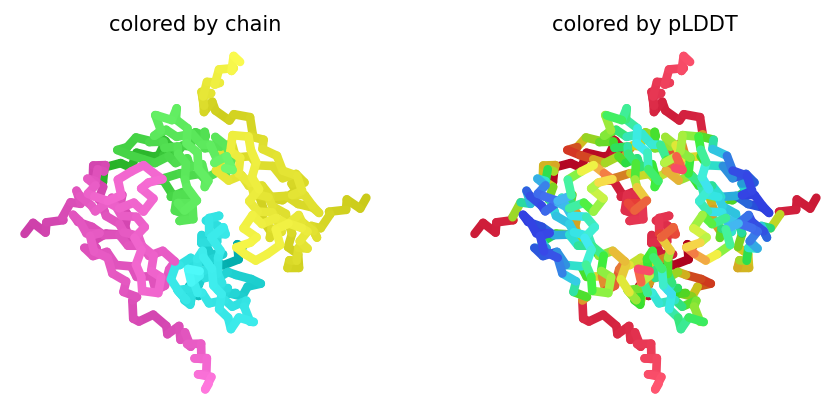

2024-11-12 20:04:16,646 alphafold2_multimer_v3_model_5_seed_006 recycle=0 pLDDT=59.9 pTM=0.306 ipTM=0.111
2024-11-12 20:04:16,647 alphafold2_multimer_v3_model_5_seed_006 took 9.7s (0 recycles)


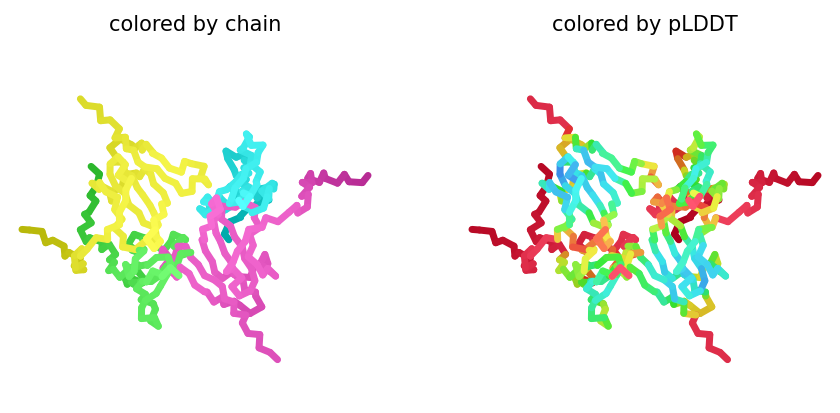

2024-11-12 20:04:26,830 alphafold2_multimer_v3_model_1_seed_007 recycle=0 pLDDT=59 pTM=0.312 ipTM=0.118
2024-11-12 20:04:26,832 alphafold2_multimer_v3_model_1_seed_007 took 9.8s (0 recycles)


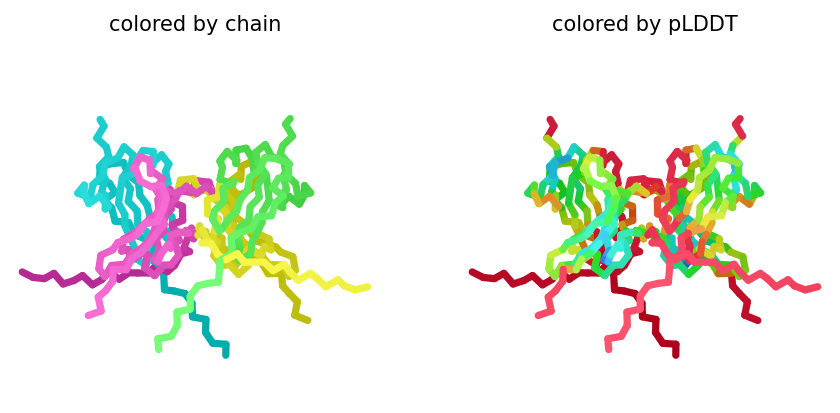

2024-11-12 20:04:37,011 alphafold2_multimer_v3_model_2_seed_007 recycle=0 pLDDT=59.6 pTM=0.309 ipTM=0.11
2024-11-12 20:04:37,013 alphafold2_multimer_v3_model_2_seed_007 took 9.8s (0 recycles)


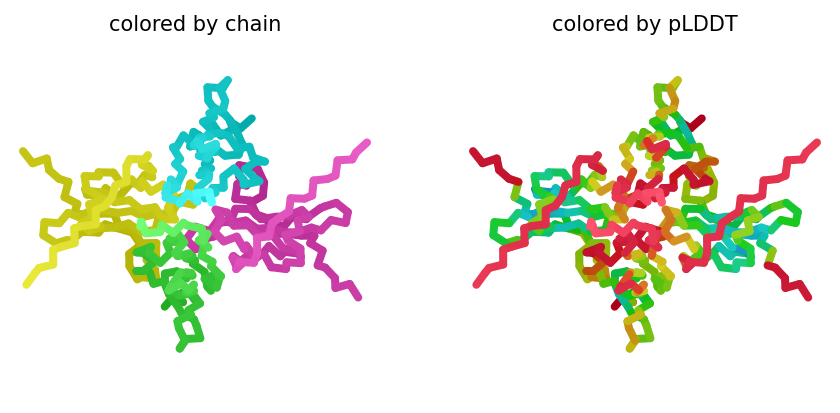

2024-11-12 20:04:47,217 alphafold2_multimer_v3_model_3_seed_007 recycle=0 pLDDT=59.9 pTM=0.308 ipTM=0.116
2024-11-12 20:04:47,218 alphafold2_multimer_v3_model_3_seed_007 took 9.8s (0 recycles)


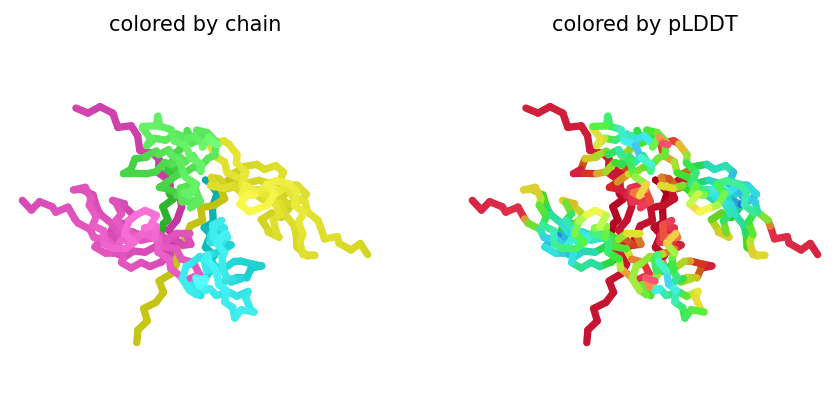

2024-11-12 20:04:57,401 alphafold2_multimer_v3_model_4_seed_007 recycle=0 pLDDT=62.2 pTM=0.334 ipTM=0.144
2024-11-12 20:04:57,402 alphafold2_multimer_v3_model_4_seed_007 took 9.8s (0 recycles)


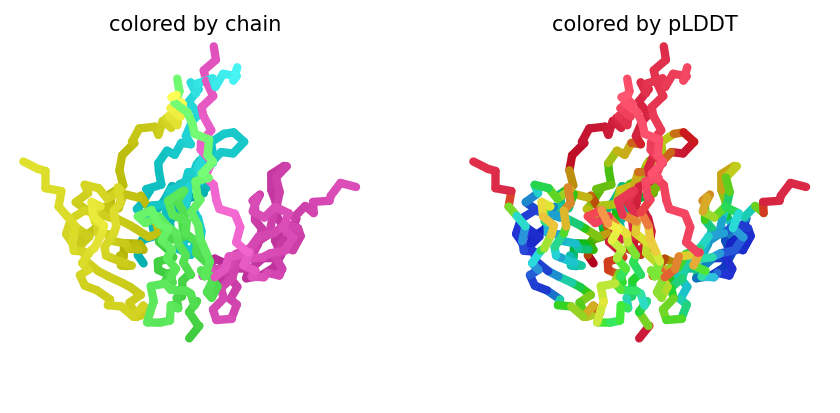

2024-11-12 20:05:07,590 alphafold2_multimer_v3_model_5_seed_007 recycle=0 pLDDT=60.3 pTM=0.315 ipTM=0.121
2024-11-12 20:05:07,591 alphafold2_multimer_v3_model_5_seed_007 took 9.8s (0 recycles)


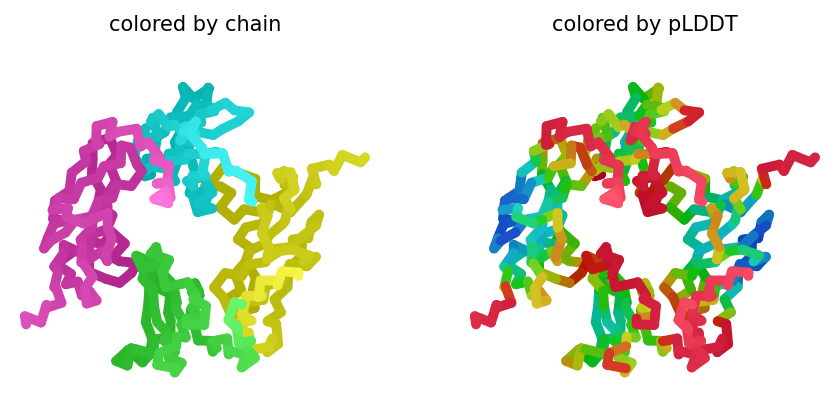

2024-11-12 20:05:17,753 alphafold2_multimer_v3_model_1_seed_008 recycle=0 pLDDT=55.9 pTM=0.305 ipTM=0.114
2024-11-12 20:05:17,754 alphafold2_multimer_v3_model_1_seed_008 took 9.7s (0 recycles)


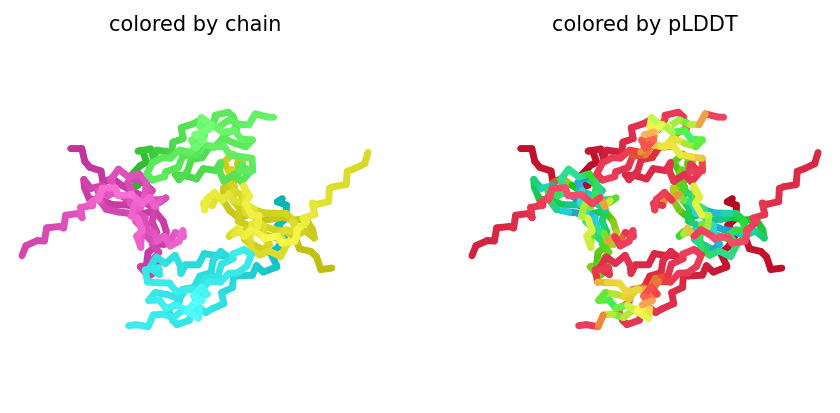

2024-11-12 20:05:27,897 alphafold2_multimer_v3_model_2_seed_008 recycle=0 pLDDT=59.6 pTM=0.304 ipTM=0.105
2024-11-12 20:05:27,899 alphafold2_multimer_v3_model_2_seed_008 took 9.7s (0 recycles)


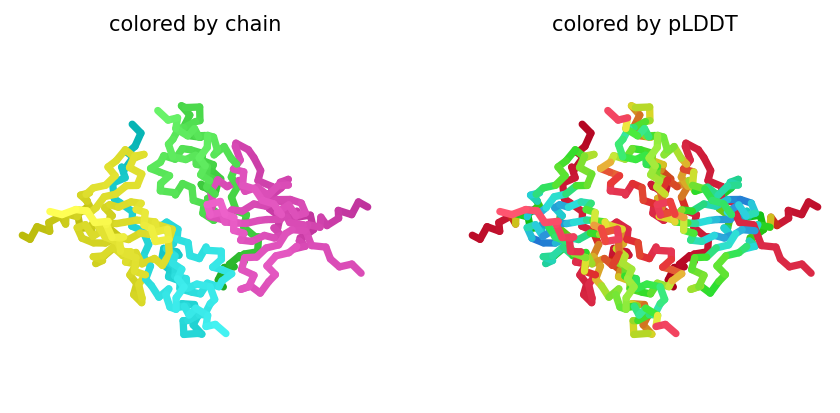

2024-11-12 20:05:38,032 alphafold2_multimer_v3_model_3_seed_008 recycle=0 pLDDT=60.1 pTM=0.312 ipTM=0.129
2024-11-12 20:05:38,033 alphafold2_multimer_v3_model_3_seed_008 took 9.7s (0 recycles)


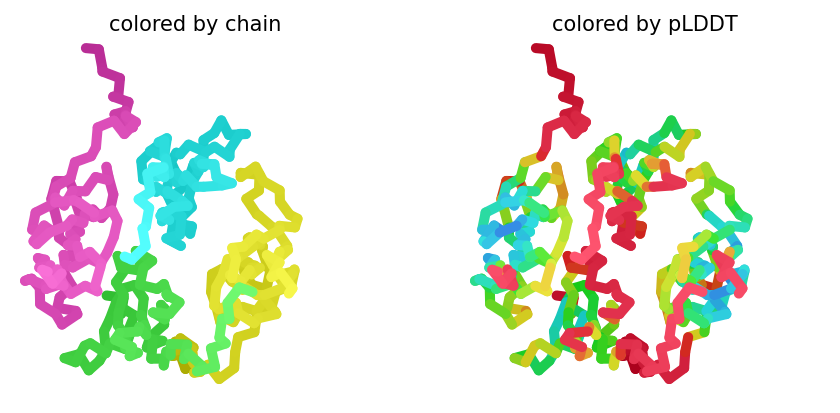

2024-11-12 20:05:48,213 alphafold2_multimer_v3_model_4_seed_008 recycle=0 pLDDT=62.8 pTM=0.347 ipTM=0.17
2024-11-12 20:05:48,214 alphafold2_multimer_v3_model_4_seed_008 took 9.8s (0 recycles)


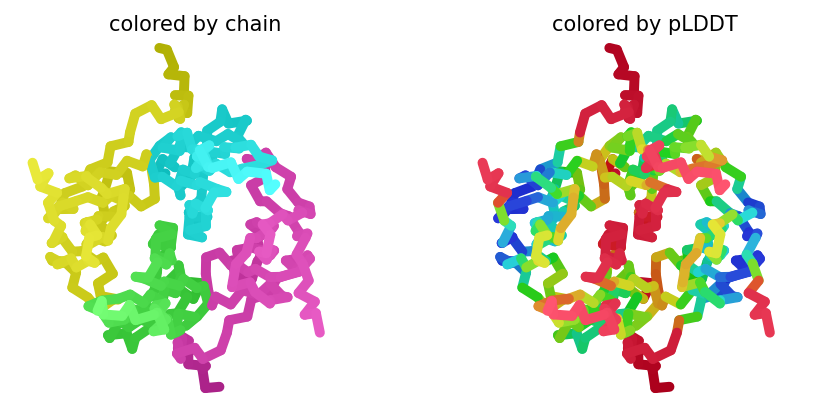

2024-11-12 20:05:58,391 alphafold2_multimer_v3_model_5_seed_008 recycle=0 pLDDT=59.6 pTM=0.325 ipTM=0.146
2024-11-12 20:05:58,392 alphafold2_multimer_v3_model_5_seed_008 took 9.8s (0 recycles)


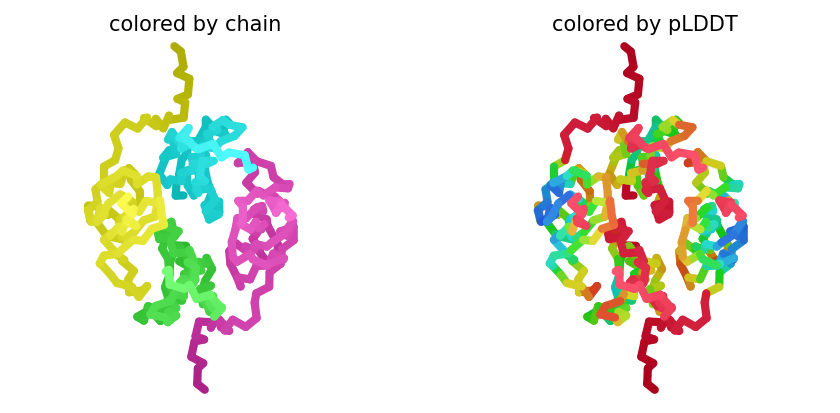

2024-11-12 20:06:08,592 alphafold2_multimer_v3_model_1_seed_009 recycle=0 pLDDT=59.4 pTM=0.304 ipTM=0.129
2024-11-12 20:06:08,593 alphafold2_multimer_v3_model_1_seed_009 took 9.8s (0 recycles)


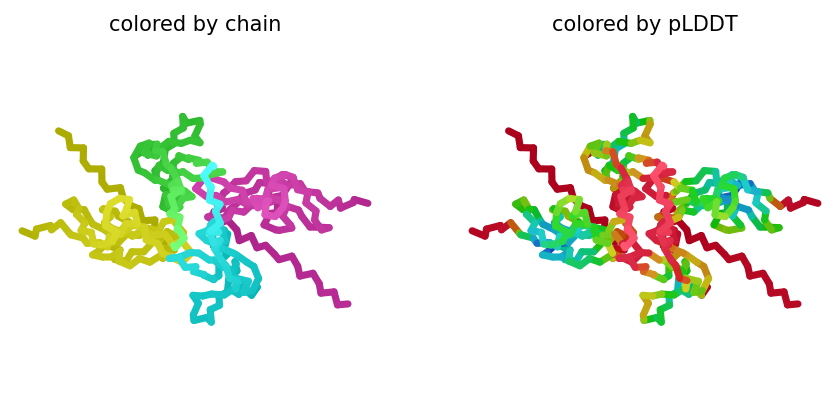

2024-11-12 20:06:18,772 alphafold2_multimer_v3_model_2_seed_009 recycle=0 pLDDT=59.7 pTM=0.306 ipTM=0.111
2024-11-12 20:06:18,774 alphafold2_multimer_v3_model_2_seed_009 took 9.8s (0 recycles)


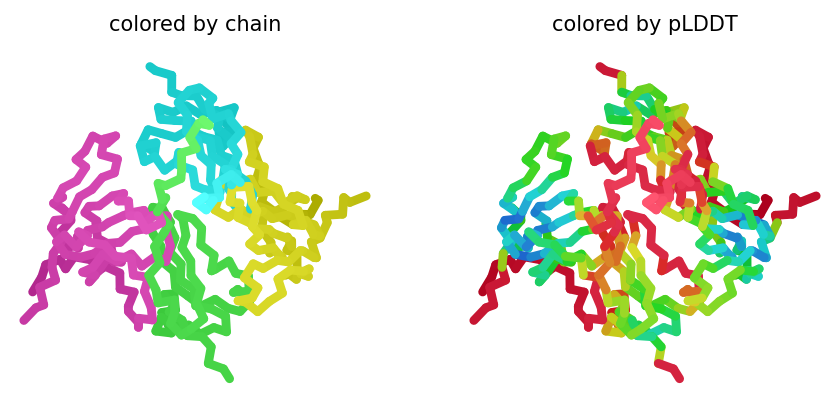

2024-11-12 20:06:28,966 alphafold2_multimer_v3_model_3_seed_009 recycle=0 pLDDT=60.9 pTM=0.317 ipTM=0.133
2024-11-12 20:06:28,967 alphafold2_multimer_v3_model_3_seed_009 took 9.8s (0 recycles)


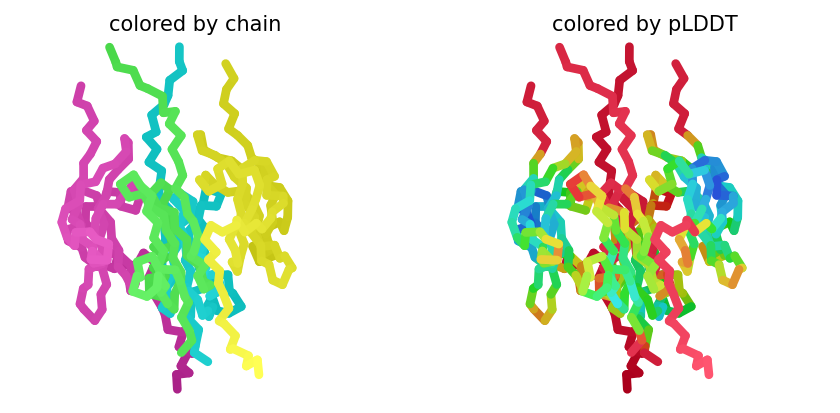

2024-11-12 20:06:39,181 alphafold2_multimer_v3_model_4_seed_009 recycle=0 pLDDT=62.8 pTM=0.328 ipTM=0.136
2024-11-12 20:06:39,182 alphafold2_multimer_v3_model_4_seed_009 took 9.8s (0 recycles)


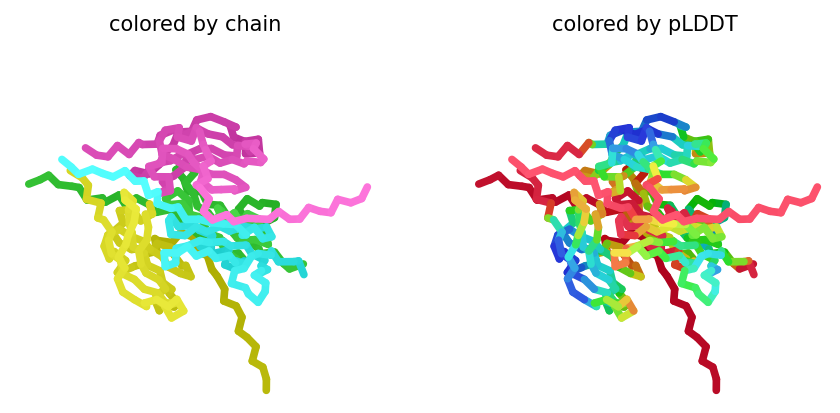

2024-11-12 20:06:49,377 alphafold2_multimer_v3_model_5_seed_009 recycle=0 pLDDT=59.4 pTM=0.314 ipTM=0.138
2024-11-12 20:06:49,379 alphafold2_multimer_v3_model_5_seed_009 took 9.8s (0 recycles)


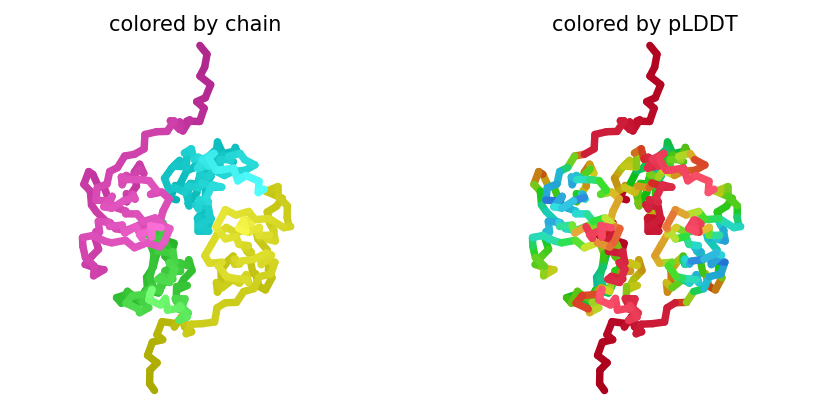

2024-11-12 20:06:59,567 alphafold2_multimer_v3_model_1_seed_010 recycle=0 pLDDT=57.3 pTM=0.312 ipTM=0.116
2024-11-12 20:06:59,568 alphafold2_multimer_v3_model_1_seed_010 took 9.8s (0 recycles)


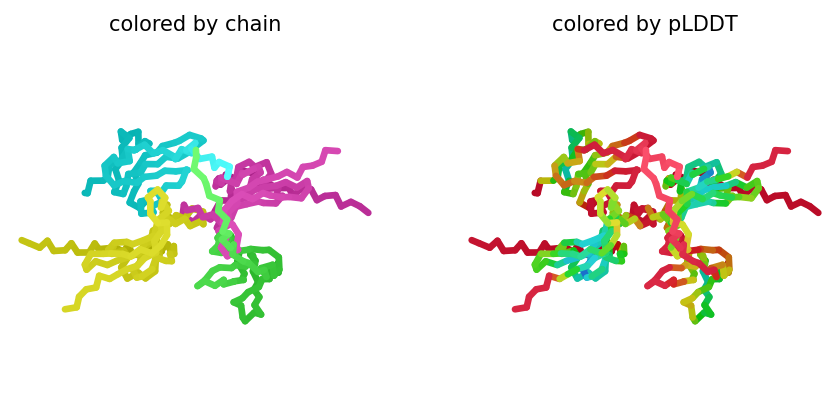

2024-11-12 20:07:09,740 alphafold2_multimer_v3_model_2_seed_010 recycle=0 pLDDT=60 pTM=0.307 ipTM=0.11
2024-11-12 20:07:09,742 alphafold2_multimer_v3_model_2_seed_010 took 9.8s (0 recycles)


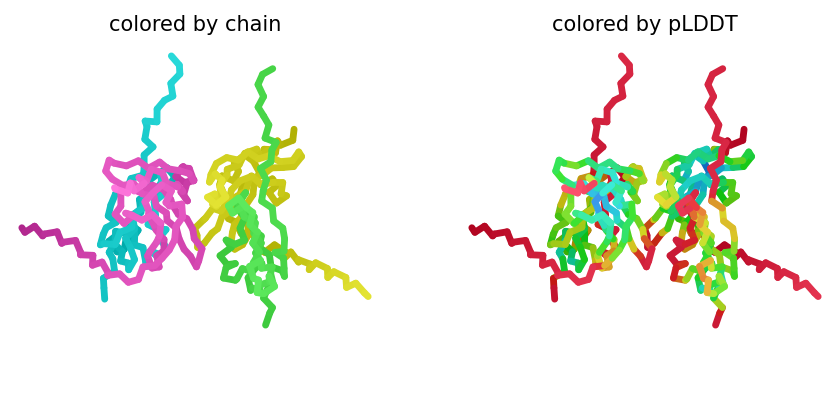

2024-11-12 20:07:19,903 alphafold2_multimer_v3_model_3_seed_010 recycle=0 pLDDT=60 pTM=0.303 ipTM=0.122
2024-11-12 20:07:19,904 alphafold2_multimer_v3_model_3_seed_010 took 9.8s (0 recycles)


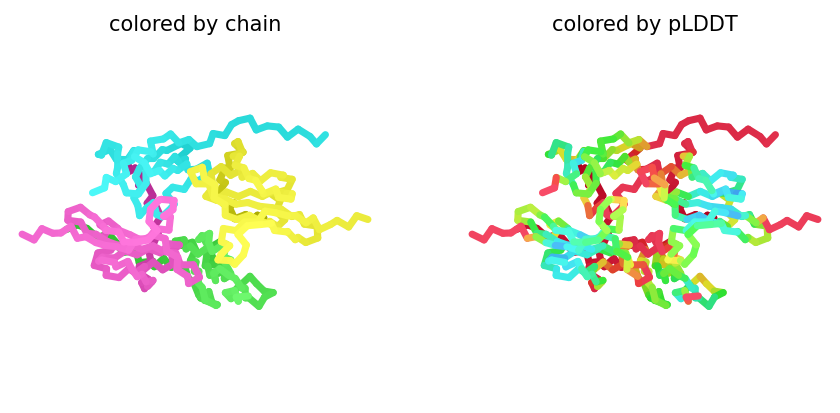

2024-11-12 20:07:30,066 alphafold2_multimer_v3_model_4_seed_010 recycle=0 pLDDT=63 pTM=0.342 ipTM=0.154
2024-11-12 20:07:30,068 alphafold2_multimer_v3_model_4_seed_010 took 9.7s (0 recycles)


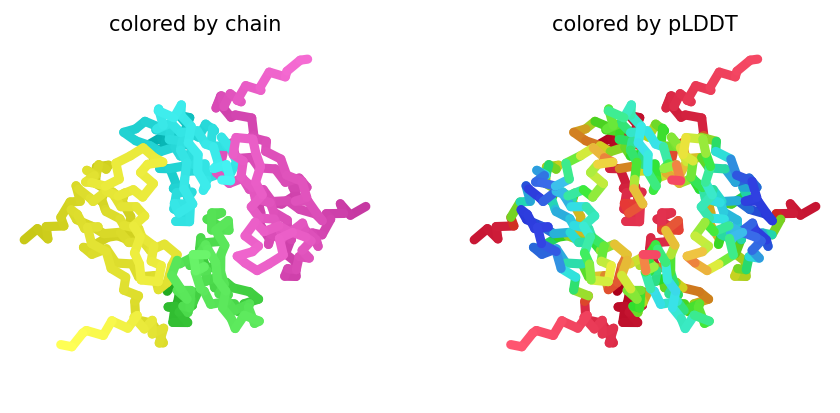

2024-11-12 20:07:40,226 alphafold2_multimer_v3_model_5_seed_010 recycle=0 pLDDT=60.6 pTM=0.318 ipTM=0.14
2024-11-12 20:07:40,227 alphafold2_multimer_v3_model_5_seed_010 took 9.7s (0 recycles)


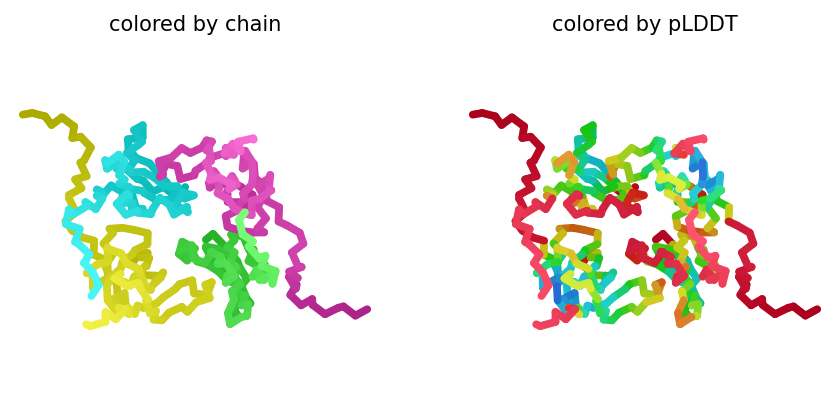

2024-11-12 20:07:50,372 alphafold2_multimer_v3_model_1_seed_011 recycle=0 pLDDT=59.6 pTM=0.313 ipTM=0.113
2024-11-12 20:07:50,374 alphafold2_multimer_v3_model_1_seed_011 took 9.7s (0 recycles)


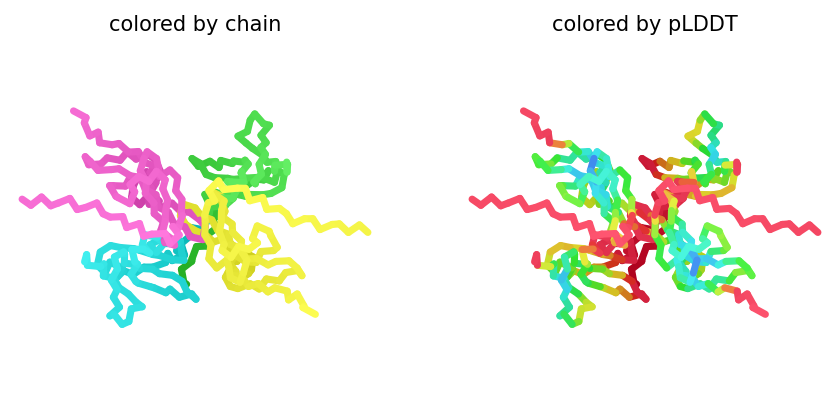

2024-11-12 20:08:00,540 alphafold2_multimer_v3_model_2_seed_011 recycle=0 pLDDT=58.2 pTM=0.309 ipTM=0.112
2024-11-12 20:08:00,541 alphafold2_multimer_v3_model_2_seed_011 took 9.8s (0 recycles)


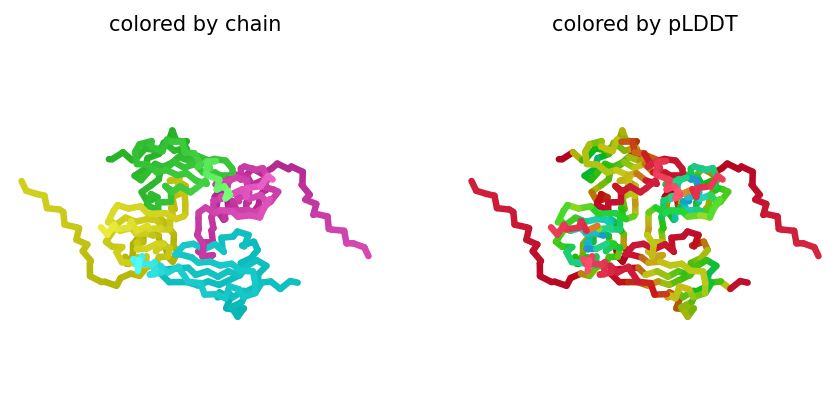

2024-11-12 20:08:10,723 alphafold2_multimer_v3_model_3_seed_011 recycle=0 pLDDT=58.2 pTM=0.301 ipTM=0.117
2024-11-12 20:08:10,725 alphafold2_multimer_v3_model_3_seed_011 took 9.8s (0 recycles)


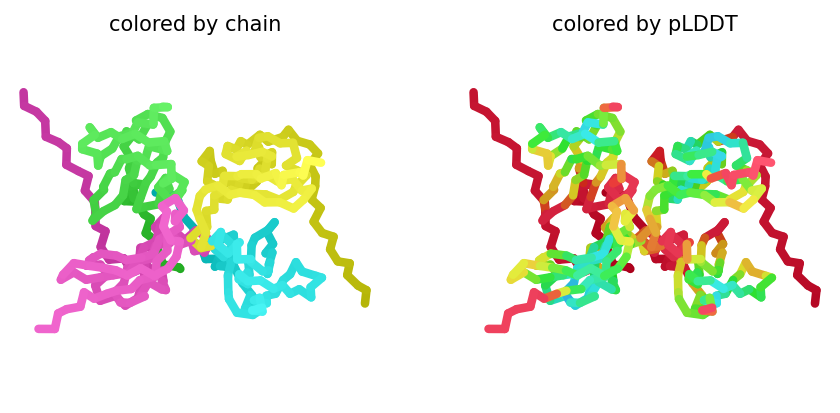

2024-11-12 20:08:20,911 alphafold2_multimer_v3_model_4_seed_011 recycle=0 pLDDT=61.2 pTM=0.332 ipTM=0.145
2024-11-12 20:08:20,912 alphafold2_multimer_v3_model_4_seed_011 took 9.8s (0 recycles)


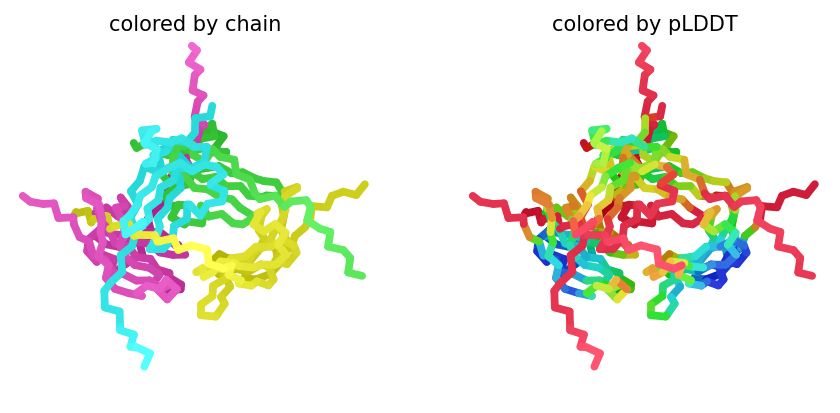

2024-11-12 20:08:31,104 alphafold2_multimer_v3_model_5_seed_011 recycle=0 pLDDT=60.2 pTM=0.313 ipTM=0.131
2024-11-12 20:08:31,105 alphafold2_multimer_v3_model_5_seed_011 took 9.8s (0 recycles)


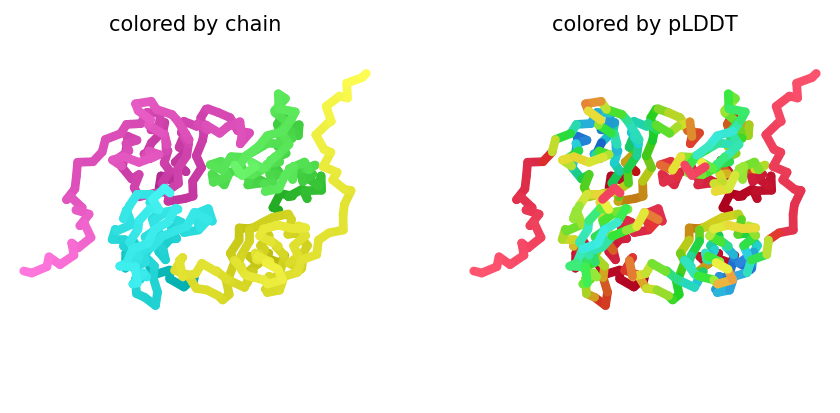

2024-11-12 20:08:41,293 alphafold2_multimer_v3_model_1_seed_012 recycle=0 pLDDT=59.4 pTM=0.321 ipTM=0.129
2024-11-12 20:08:41,294 alphafold2_multimer_v3_model_1_seed_012 took 9.8s (0 recycles)


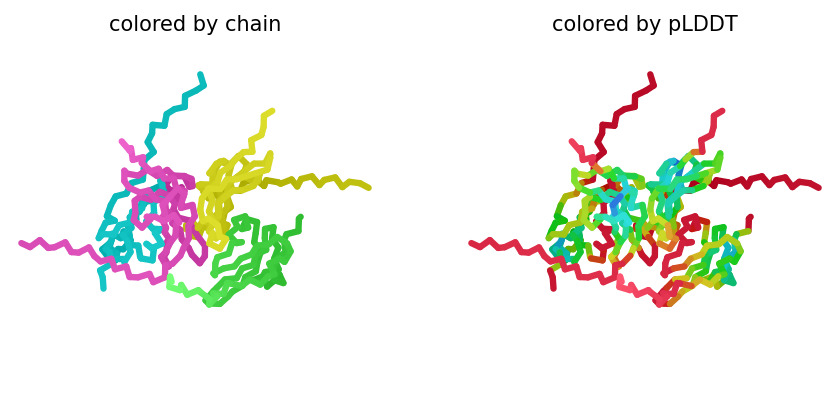

2024-11-12 20:08:51,483 alphafold2_multimer_v3_model_2_seed_012 recycle=0 pLDDT=59.8 pTM=0.307 ipTM=0.11
2024-11-12 20:08:51,484 alphafold2_multimer_v3_model_2_seed_012 took 9.8s (0 recycles)


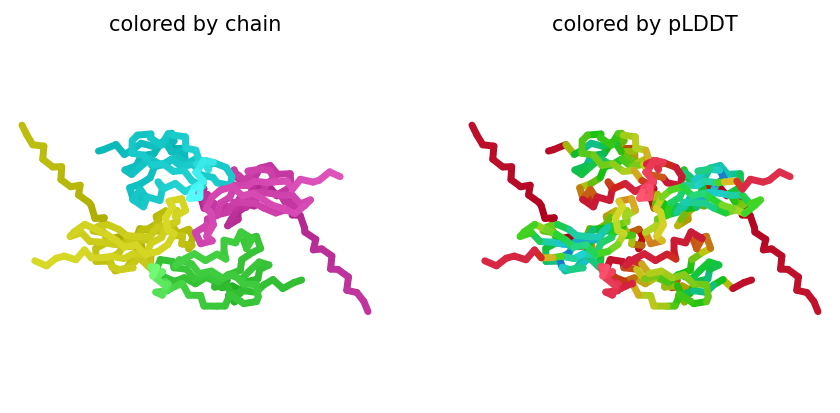

2024-11-12 20:09:01,667 alphafold2_multimer_v3_model_3_seed_012 recycle=0 pLDDT=60.6 pTM=0.304 ipTM=0.116
2024-11-12 20:09:01,669 alphafold2_multimer_v3_model_3_seed_012 took 9.8s (0 recycles)


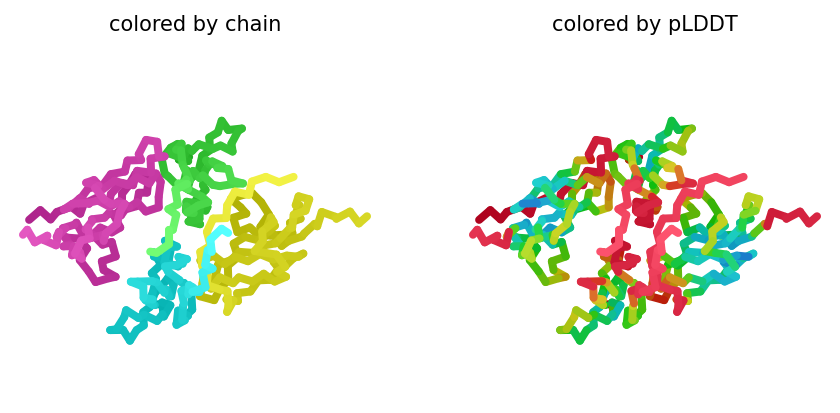

2024-11-12 20:09:11,849 alphafold2_multimer_v3_model_4_seed_012 recycle=0 pLDDT=61.9 pTM=0.326 ipTM=0.136
2024-11-12 20:09:11,851 alphafold2_multimer_v3_model_4_seed_012 took 9.8s (0 recycles)


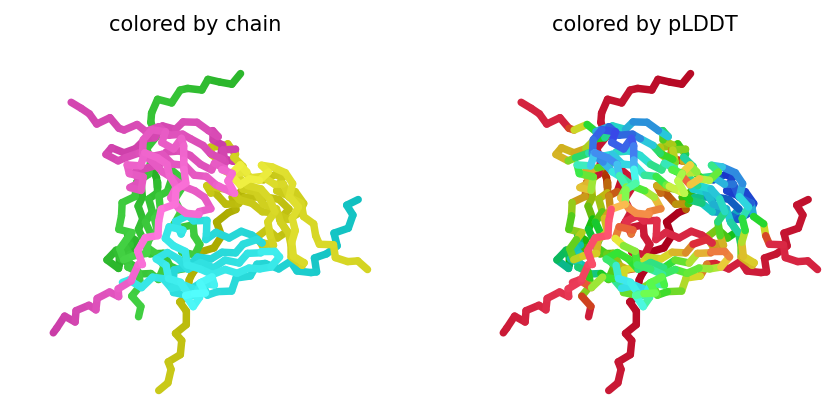

2024-11-12 20:09:22,035 alphafold2_multimer_v3_model_5_seed_012 recycle=0 pLDDT=60.3 pTM=0.299 ipTM=0.107
2024-11-12 20:09:22,037 alphafold2_multimer_v3_model_5_seed_012 took 9.8s (0 recycles)


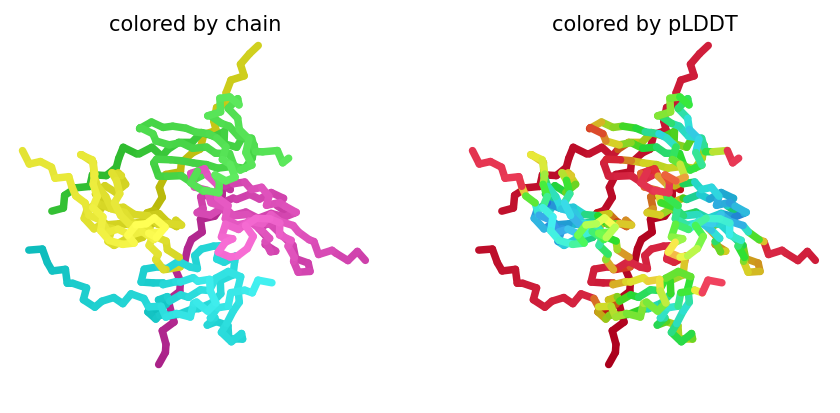

2024-11-12 20:09:32,196 alphafold2_multimer_v3_model_1_seed_013 recycle=0 pLDDT=57.4 pTM=0.307 ipTM=0.121
2024-11-12 20:09:32,197 alphafold2_multimer_v3_model_1_seed_013 took 9.7s (0 recycles)


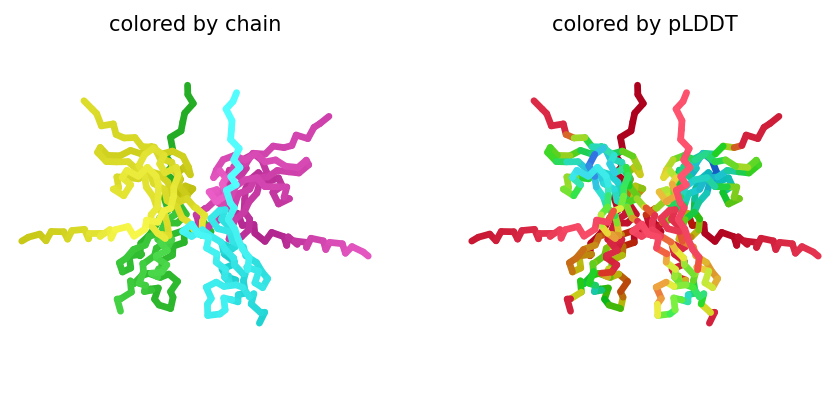

2024-11-12 20:09:42,374 alphafold2_multimer_v3_model_2_seed_013 recycle=0 pLDDT=60.7 pTM=0.303 ipTM=0.106
2024-11-12 20:09:42,375 alphafold2_multimer_v3_model_2_seed_013 took 9.8s (0 recycles)


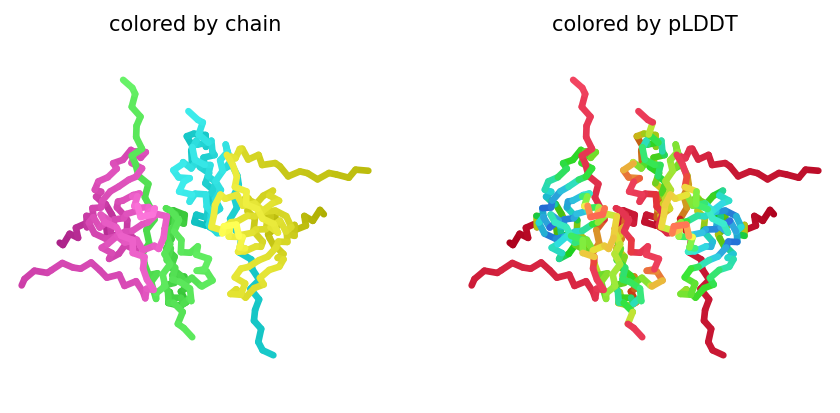

2024-11-12 20:09:52,511 alphafold2_multimer_v3_model_3_seed_013 recycle=0 pLDDT=59.4 pTM=0.301 ipTM=0.11
2024-11-12 20:09:52,512 alphafold2_multimer_v3_model_3_seed_013 took 9.7s (0 recycles)


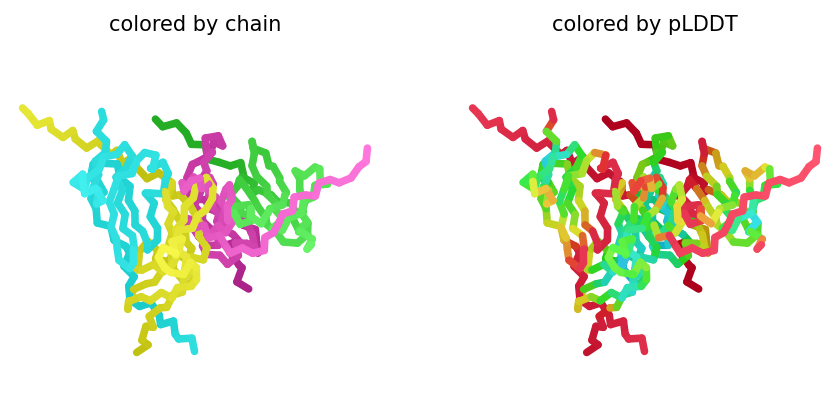

2024-11-12 20:10:02,662 alphafold2_multimer_v3_model_4_seed_013 recycle=0 pLDDT=62.2 pTM=0.342 ipTM=0.158
2024-11-12 20:10:02,664 alphafold2_multimer_v3_model_4_seed_013 took 9.7s (0 recycles)


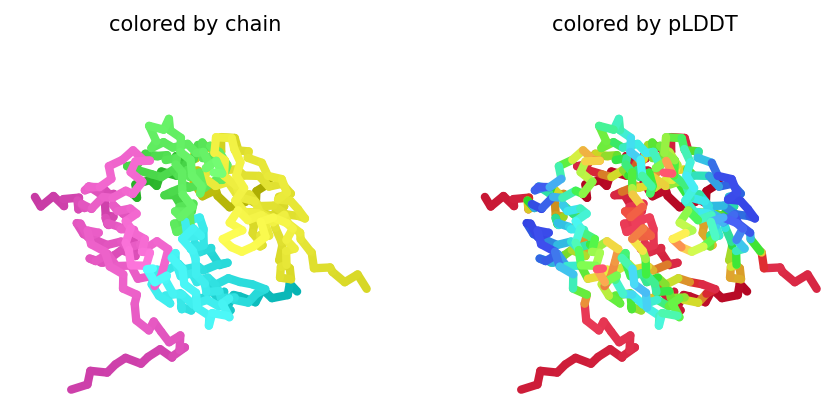

2024-11-12 20:10:12,836 alphafold2_multimer_v3_model_5_seed_013 recycle=0 pLDDT=60.3 pTM=0.309 ipTM=0.118
2024-11-12 20:10:12,837 alphafold2_multimer_v3_model_5_seed_013 took 9.8s (0 recycles)


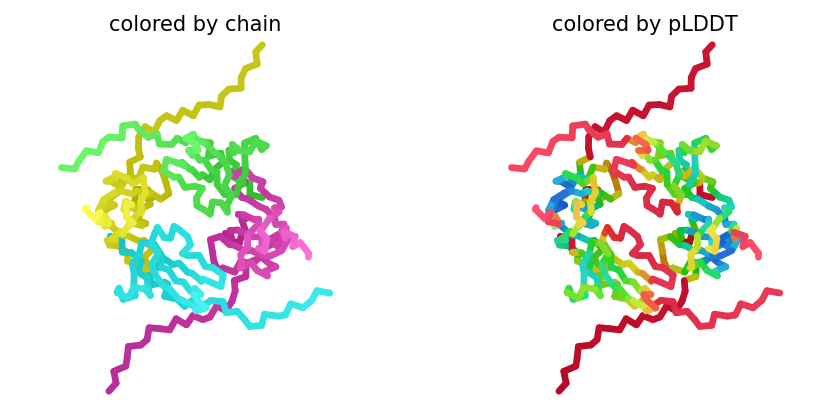

2024-11-12 20:10:23,004 alphafold2_multimer_v3_model_1_seed_014 recycle=0 pLDDT=56.7 pTM=0.302 ipTM=0.126
2024-11-12 20:10:23,006 alphafold2_multimer_v3_model_1_seed_014 took 9.7s (0 recycles)


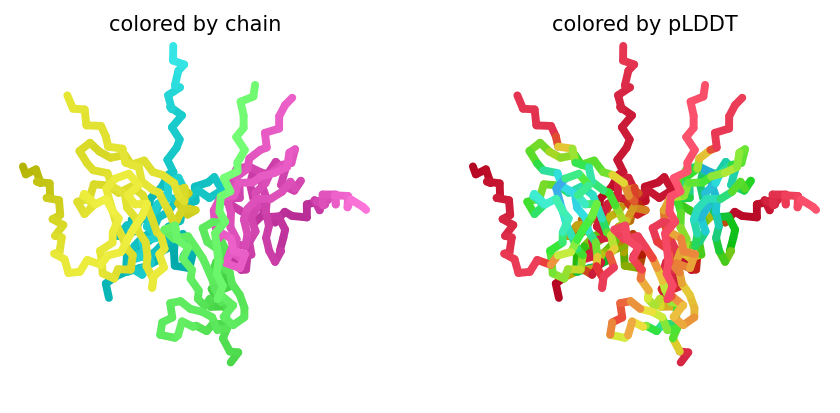

2024-11-12 20:10:33,172 alphafold2_multimer_v3_model_2_seed_014 recycle=0 pLDDT=60.1 pTM=0.3 ipTM=0.103
2024-11-12 20:10:33,174 alphafold2_multimer_v3_model_2_seed_014 took 9.8s (0 recycles)


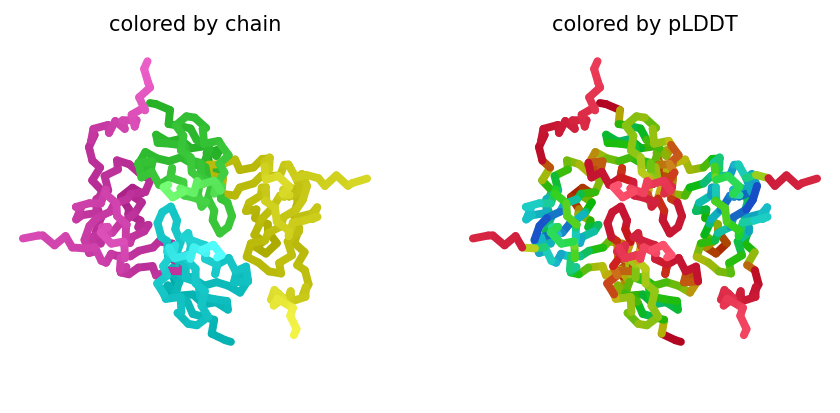

2024-11-12 20:10:43,301 alphafold2_multimer_v3_model_3_seed_014 recycle=0 pLDDT=59.3 pTM=0.308 ipTM=0.12
2024-11-12 20:10:43,303 alphafold2_multimer_v3_model_3_seed_014 took 9.7s (0 recycles)


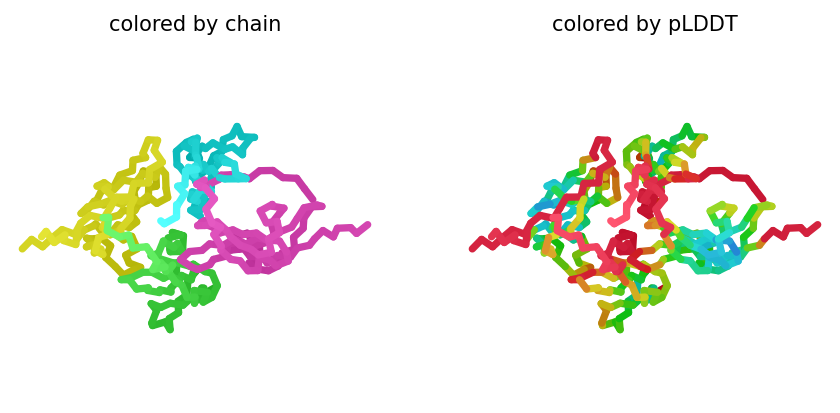

2024-11-12 20:10:53,435 alphafold2_multimer_v3_model_4_seed_014 recycle=0 pLDDT=62.2 pTM=0.335 ipTM=0.148
2024-11-12 20:10:53,437 alphafold2_multimer_v3_model_4_seed_014 took 9.7s (0 recycles)


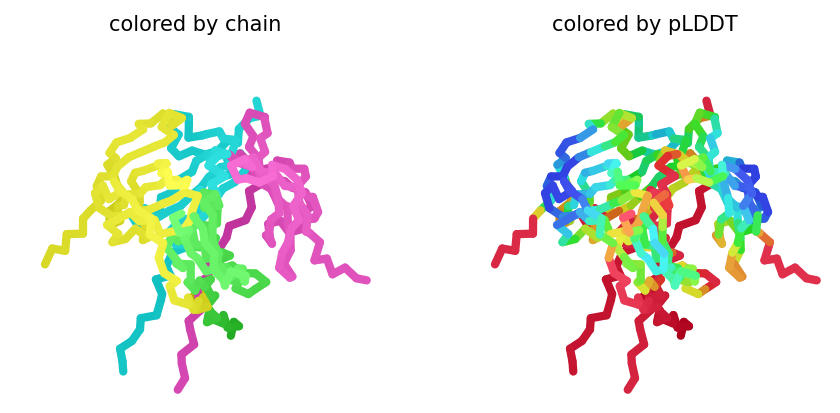

2024-11-12 20:11:04,176 alphafold2_multimer_v3_model_5_seed_014 recycle=0 pLDDT=60.7 pTM=0.312 ipTM=0.12
2024-11-12 20:11:04,177 alphafold2_multimer_v3_model_5_seed_014 took 9.8s (0 recycles)


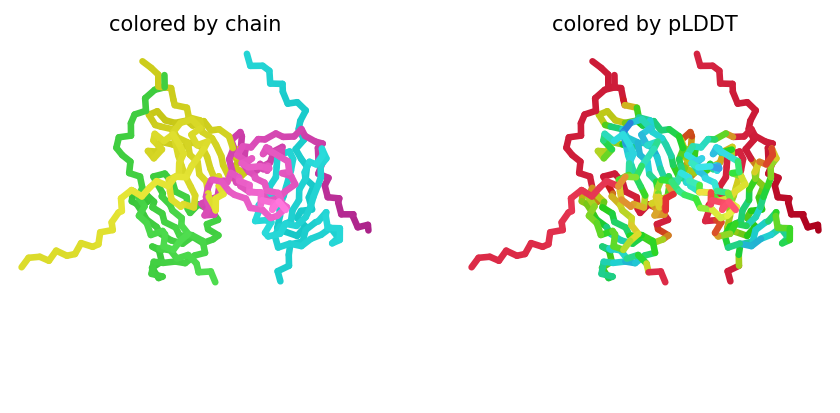

2024-11-12 20:11:14,368 alphafold2_multimer_v3_model_1_seed_015 recycle=0 pLDDT=58.1 pTM=0.313 ipTM=0.12
2024-11-12 20:11:14,369 alphafold2_multimer_v3_model_1_seed_015 took 9.8s (0 recycles)


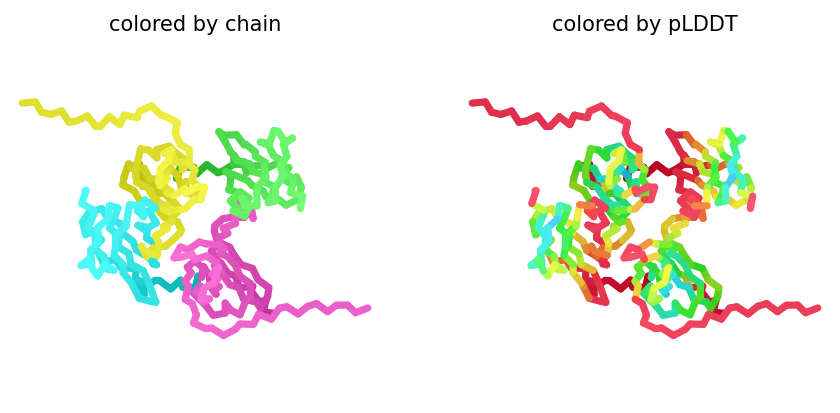

2024-11-12 20:11:24,593 alphafold2_multimer_v3_model_2_seed_015 recycle=0 pLDDT=60.6 pTM=0.298 ipTM=0.105
2024-11-12 20:11:24,594 alphafold2_multimer_v3_model_2_seed_015 took 9.8s (0 recycles)


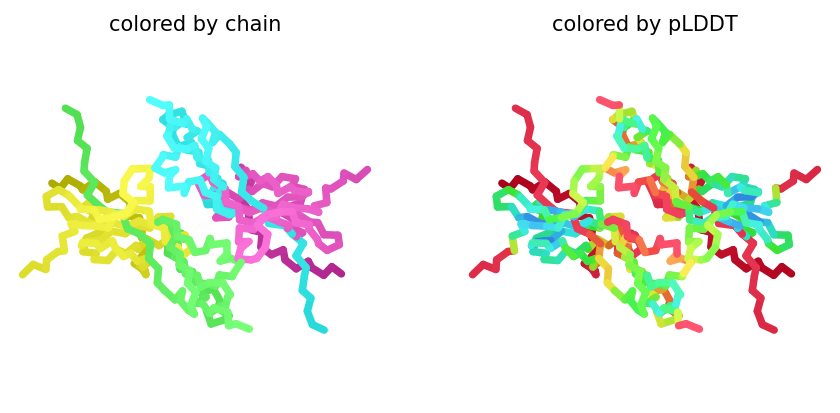

2024-11-12 20:11:34,815 alphafold2_multimer_v3_model_3_seed_015 recycle=0 pLDDT=60.6 pTM=0.307 ipTM=0.126
2024-11-12 20:11:34,816 alphafold2_multimer_v3_model_3_seed_015 took 9.8s (0 recycles)


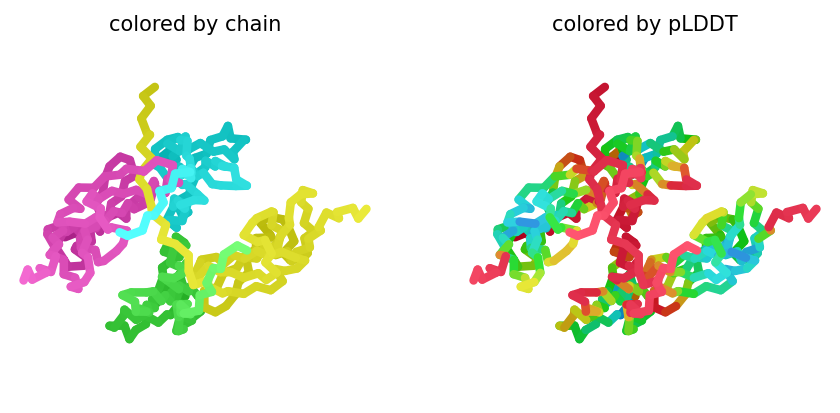

2024-11-12 20:11:45,013 alphafold2_multimer_v3_model_4_seed_015 recycle=0 pLDDT=63.2 pTM=0.338 ipTM=0.153
2024-11-12 20:11:45,014 alphafold2_multimer_v3_model_4_seed_015 took 9.8s (0 recycles)


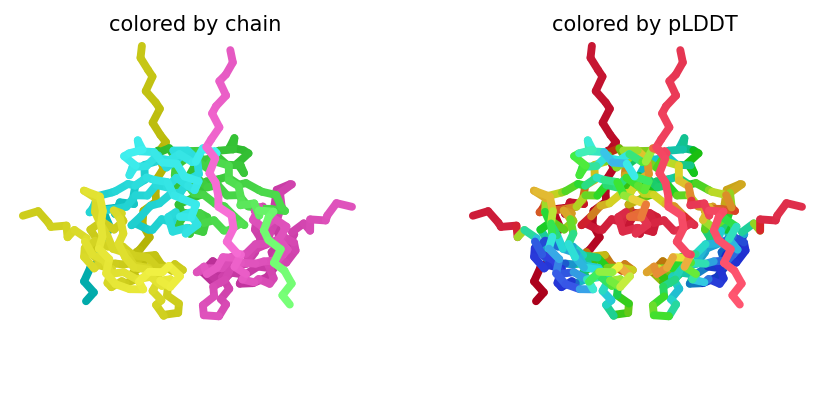

2024-11-12 20:11:55,197 alphafold2_multimer_v3_model_5_seed_015 recycle=0 pLDDT=60.2 pTM=0.32 ipTM=0.135
2024-11-12 20:11:55,199 alphafold2_multimer_v3_model_5_seed_015 took 9.8s (0 recycles)


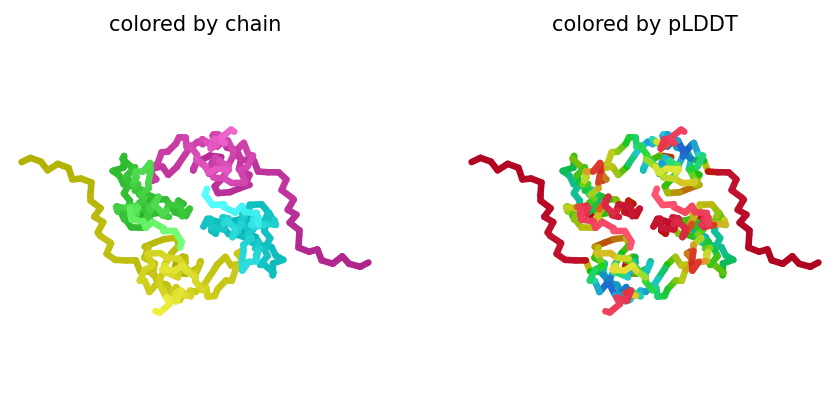

2024-11-12 20:11:55,615 reranking models by 'multimer' metric
2024-11-12 20:11:56,441 Warning: importing 'simtk.openmm' is deprecated.  Import 'openmm' instead.
2024-11-12 20:13:50,293 Relaxation took 114.7s
2024-11-12 20:13:50,294 rank_001_alphafold2_multimer_v3_model_5_seed_000 pLDDT=59.5 pTM=0.34 ipTM=0.182
2024-11-12 20:18:29,711 Relaxation took 279.4s
2024-11-12 20:18:29,711 rank_002_alphafold2_multimer_v3_model_4_seed_008 pLDDT=62.8 pTM=0.347 ipTM=0.17
2024-11-12 20:23:45,244 Relaxation took 315.5s
2024-11-12 20:23:45,245 rank_003_alphafold2_multimer_v3_model_4_seed_005 pLDDT=62.5 pTM=0.351 ipTM=0.168
2024-11-12 20:31:16,606 Relaxation took 451.4s
2024-11-12 20:31:16,607 rank_004_alphafold2_multimer_v3_model_4_seed_013 pLDDT=62.2 pTM=0.342 ipTM=0.158
2024-11-12 20:37:18,064 Relaxation took 361.5s
2024-11-12 20:37:18,065 rank_005_alphafold2_multimer_v3_model_4_seed_010 pLDDT=63 pTM=0.342 ipTM=0.154
2024-11-12 20:37:18,065 rank_006_alphafold2_multimer_v3_model_4_seed_015 pLDDT=63.2

0

In [5]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
setup_logging(Path(log_filename))

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    relax_max_iterations=relax_max_iterations,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
    user_agent="colabfold/google-colab-main",
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

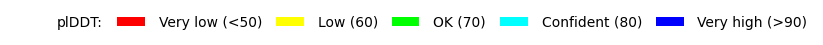

In [6]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


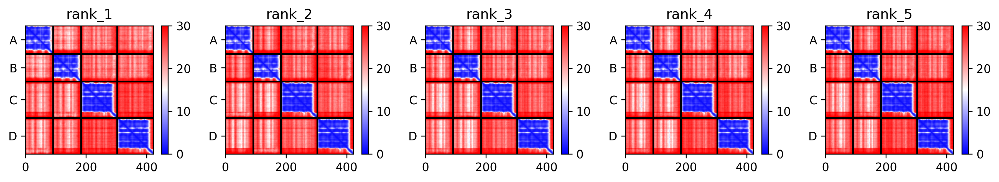
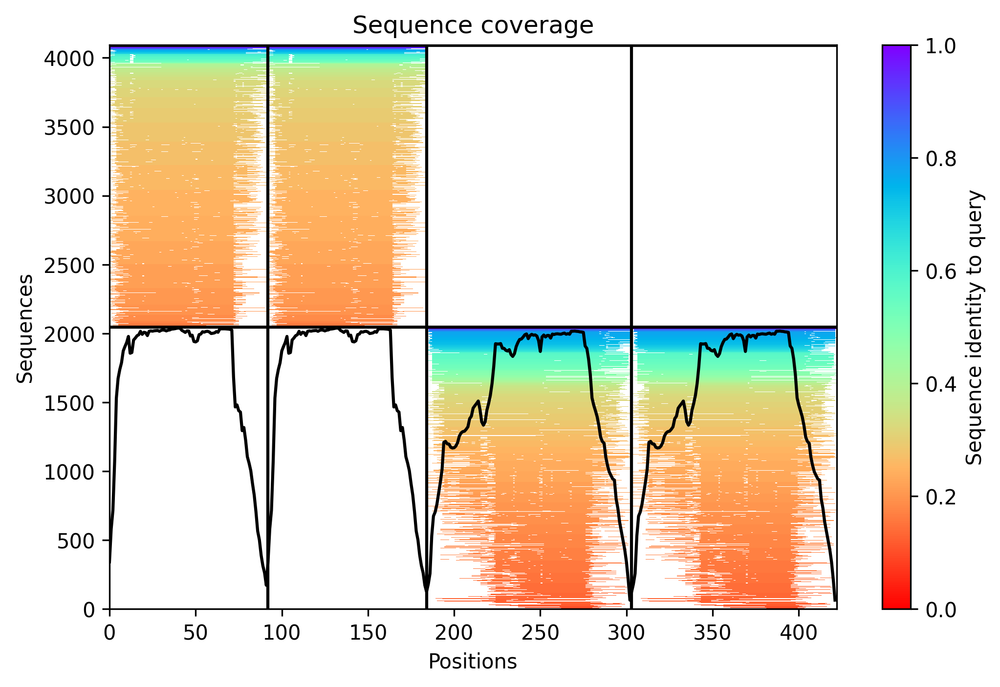
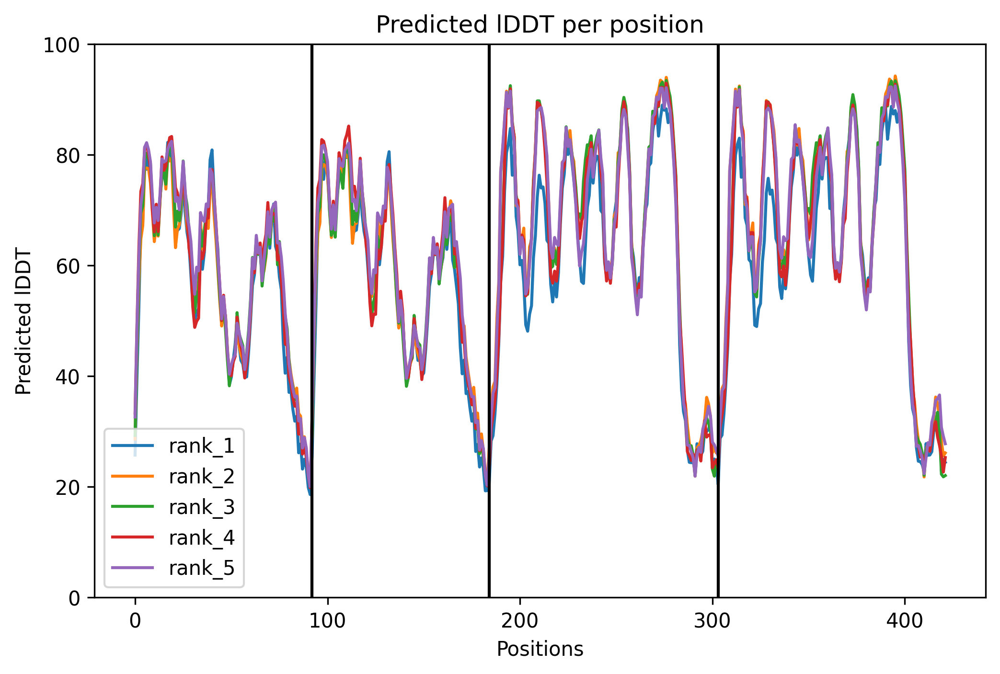

In [7]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = ""
pae_file = os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png")
if os.path.isfile(pae_file):
    pae = image_to_data_url(pae_file)
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  { '<!--' if pae == '' else '' }<img src="{pae}" class="full" />{ '-->' if pae == '' else '' }
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))

In [8]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uploaded ECDs_only_tetramer_Apo_184a4.result.zip to Google Drive with ID 1K-RqPghd6thiAIKA4tpGEIXJb9eRiSxF


# Instructions <a name="Instructions"></a>
For detailed instructions, tips and tricks, see recently published paper at [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5)

**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
